In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# New Section

To download Flickr Data set and unzip it . It has 8000 images and we will be using 5000 for training , 1000 validation and 2000 for testing 

In [ ]:
#Importing all libraries for Keras , Tensorflow and Resnet50

In [ ]:
import string
import numpy as np
import pandas as pd 
from numpy import array
from PIL import Image
import pickle
import tensorflow as tf
import matplotlib.pyplot as plt
import keras
import sys, time, os, warnings 
warnings.filterwarnings("ignore")
import re

import tensorflow as tf
from tqdm import tqdm

from nltk.translate.bleu_score import sentence_bleu

from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.utils import plot_model
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense, BatchNormalization
from keras.layers import LSTM
from keras.layers import Embedding
from keras.layers import Dropout
#from keras.layers.merge import add
from keras.callbacks import ModelCheckpoint
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from keras.preprocessing.text import Tokenizer
from tensorflow.keras.applications.resnet50 import ResNet50
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle

In [ ]:
!pip uninstall tensorflow
!pip install tensorflow==2.0

In [ ]:
from tensorflow.keras.applications.resnet50 import ResNet50

In [ ]:
!pip install tensorflow

In [ ]:
from sklearn.utils import shuffle

In [ ]:
import os #/content/gdrive/MyDrive
os.chdir('/content/drive/MyDrive/Project Files/')
# os.chdir('/content/')

In [ ]:
!zipfiles '/content/drive/MyDrive/Project Files/flickr30k_1'

/bin/bash: zipfiles: command not found


In [ ]:
os.chdir('/content/sample_data/')

In [ ]:
https://drive.google.com/file/d/1gqnYlRwSU4Qiqkwpmj6Q-yjLuaESi0ay/view?usp=sharing
https://drive.google.com/drive/folders/1bYCzjGFUqW6Kf741wEHepv6vQIzCsMS-?usp=sharing

In [ ]:
! gdown --id 1gqnYlRwSU4Qiqkwpmj6Q-yjLuaESi0ay

/usr/local/lib/python3.7/dist-packages/gdown/cli.py:131: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  category=FutureWarning,
Downloading...
From: https://drive.google.com/uc?id=1gqnYlRwSU4Qiqkwpmj6Q-yjLuaESi0ay
To: /content/drive/MyDrive/Project Files/flickr30k.zip
100% 4.38G/4.38G [00:34<00:00, 126MB/s]


In [ ]:
https://drive.google.com/file/d/1--mY-Pziz9TTvvX5j_wlKwPiED8oQ3wb/view?usp=sharing
https://drive.google.com/file/d/1XMDFPpFbhWnQ1aMR8SnF00CkCAwvOPmr/view?usp=sharing
https://drive.google.com/file/d/1-J0LUdMRr9QjzsMSFAp_M3LaYo4L8Zf5/view?usp=sharing
https://drive.google.com/file/d/1wbCMQIZWuR7XrNWMSgdpvIuOLhm11Ew0/view?usp=sharing
https://drive.google.com/file/d/1WKrWL1YNH2hhZh4PnctnWdo-fuBcRnjU/view?usp=sharing

In [ ]:
os.chdir('/content/sample_data/')
! gdown --id 1WKrWL1YNH2hhZh4PnctnWdo-fuBcRnjU


/usr/local/lib/python3.7/dist-packages/gdown/cli.py:131: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  category=FutureWarning,
Downloading...
From: https://drive.google.com/uc?id=1WKrWL1YNH2hhZh4PnctnWdo-fuBcRnjU
To: /content/sample_data/flickr30k_4.zip
100% 954M/954M [00:03<00:00, 278MB/s]


In [ ]:
os.chdir('/content/sample_data/')
! gdown --id 1--mY-Pziz9TTvvX5j_wlKwPiED8oQ3wb
! gdown --id 1XMDFPpFbhWnQ1aMR8SnF00CkCAwvOPmr
! gdown --id 1-J0LUdMRr9QjzsMSFAp_M3LaYo4L8Zf5
! gdown --id 1WKrWL1YNH2hhZh4PnctnWdo-fuBcRnjU


In [ ]:
!rename "flickr30k_4-20220818T082126Z-001" "flickr30k_4"
!rm -r /content/sample_data/flickr30k_4

In [ ]:
!pip install kaggle
{"username":"monicarn","key":"4b125aeee7d3ea9a2bd40fc64326ed6d"}
!mkdir ~/.kaggle
!touch ~/.kaggle/kaggle.json

api_token = {"username":"monicarn","key":"4b125aeee7d3ea9a2bd40fc64326ed6d"}

import json

with open('/root/.kaggle/kaggle.json', 'w') as file:
    json.dump(api_token, file)

!chmod 600 ~/.kaggle/kaggle.json

!kaggle datasets download -d hsankesara/flickr-image-dataset

In [ ]:
!unzip "flickr30k.zip" 

In [ ]:
!unzip -FFv flickr30k.zip

In [ ]:
!7z x flickr30k.zip

In [ ]:
!apt install p7zip-full

In [ ]:
!zip -FF flickr30k.zip --out Repairedflickr30k.zip | unzip

In [ ]:
/content/sample_data/flickr30k_4-20220818T082126Z-001.zip

In [ ]:
!unzip /content/sample_data/flickr30k_4.zip

In [ ]:
!unzip /content/sample_data/flickr30k_1.zip
!unzip /content/sample_data/flickr30k_2.zip
!unzip /content/sample_data/flickr30k_3.zip
!unzip /content/sample_data/flickr30k_4-20220818T082126Z-001.zip

In [ ]:
!zip -r "flickr30k_2.zip" "flickr30k_2"
!zip -r "flickr30k_3.zip" "flickr30k_3"
!zip -r "flickr30k_4.zip" "flickr30k_4"

In [ ]:
import pandas as pd

In [ ]:
os.listdir()

In [ ]:
import os #/content/gdrive/MyDrive
os.chdir('/content/drive/MyDrive/Project Files/')

In [ ]:
#Read results_flickr30k.csv and retain only first two columns
#We have uploaded this csv into content folder on colab
data=pd.read_csv('results - Copy.csv')
data=data[['image_name',' comment']]

data.head()

,image_name,comment
0,1000092795.jpg,Two young guys with shaggy hair look at their...
1,1000092795.jpg,Two young White males are outside near many ...
2,1000092795.jpg,Two men in green shirts are standing in a yard .
3,1000092795.jpg,A man in a blue shirt standing in a garden .
4,1000092795.jpg,Two friends enjoy time spent together .


In [ ]:
#check Image file name to Caption combination derived from the Flick8 dataset

In [ ]:
data.isna().sum()

image_name    0
 comment      0
dtype: int64

In [ ]:
data[data[' comment'].isna()]

,image_name,comment


In [ ]:
data['Comment']=data['Comment'].fillna("")

In [ ]:
len(data)

158915

In [ ]:
uni_filenames = np.unique(data.image_name.values)
data.head()

,image_name,comment
0,1000092795.jpg,Two young guys with shaggy hair look at their...
1,1000092795.jpg,Two young White males are outside near many ...
2,1000092795.jpg,Two men in green shirts are standing in a yard .
3,1000092795.jpg,A man in a blue shirt standing in a garden .
4,1000092795.jpg,Two friends enjoy time spent together .


Print some images along with captions to check the Flickr Data that was imported

In [ ]:
# Get all the words available i the captions by splitting the sentences

In [ ]:
data.columns

Index(['image_name', ' comment'], dtype='object')

In [ ]:
vocabulary = []
for txt in data[' comment'].values:
    #print(txt)
    vocabulary.extend(txt.split())
print('Vocabulary Size: %d' % len(set(vocabulary)))

Vocabulary Size: 23456


In [ ]:
# crearting a list of Image file names and captions

In [ ]:
img = data["image_name"].tolist()
caption = data[" comment"].tolist()

In [ ]:
print(f"len(img) : {len(img)}")
print(f"len(caption) : {len(caption)}")

len(img) : 158915
len(caption) : 158915


' Removing punctuations , Single characters , Numeric values from the word/Vocabulary , having them would make increase the probability of such words over others due to repetitive usage\ngiving undesired results '

In [ ]:
""" Removing punctuations , Single characters , Numeric values from the word/Vocabulary , having them would make increase the probability of such words over others due to repetitive usage
giving undesired results """
# To remove punctuations
def remove_punctuation(text_original):
    text_no_punctuation = text_original.translate(string.punctuation)
    return(text_no_punctuation)

# To remove single characters
def remove_single_character(text):
    text_len_more_than1 = ""
    for word in text.split():
        if len(word) > 1:
            text_len_more_than1 += " " + word
    return(text_len_more_than1)

# To remove numeric values
def remove_numeric(text):
    text_no_numeric = ""
    for word in text.split():
        isalpha = word.isalpha()
        if isalpha:
            text_no_numeric += " " + word
    return(text_no_numeric)

In [ ]:
""" Cleaning up the original text without punctuations, single characters and numeric values """

' Cleaning up the original text without punctuations, single characters and numeric values '

In [ ]:
def text_clean(text_original):
    text = remove_punctuation(text_original)
    text = remove_single_character(text)
    text = remove_numeric(text)
    return(text)
    
for i, caption in enumerate(data[' comment'].values):
    newcaption = text_clean(caption)
    data[' comment'].iloc[i] = newcaption

In [ ]:
#building clean vocabulary
clean_vocabulary = []
for txt in data[' comment'].values:
    clean_vocabulary.extend(txt.split())
print('Clean Vocabulary Size: %d' % len(set(clean_vocabulary)))

Clean Vocabulary Size: 20933


In [ ]:
for i in data[' comment'].astype(str):
    print(i)

In [ ]:
# adding <start> and <end> tags to sentences to identify the start and end of the sentences while looping through words in sentence

all_captions = []

for caption  in data[' comment'].astype(str):
    caption = '<start>' + caption+ ' <end>'
    all_captions.append(caption)
all_captions[:10]

['<start> Two young guys with shaggy hair look at their hands while hanging out in the yard <end>',
 '<start> Two young White males are outside near many bushes <end>',
 '<start> Two men in green shirts are standing in yard <end>',
 '<start> man in blue shirt standing in garden <end>',
 '<start> Two friends enjoy time spent together <end>',
 '<start> Several men in hard hats are operating giant pulley system <end>',
 '<start> Workers look down from up above on piece of equipment <end>',
 '<start> Two men working on machine wearing hard hats <end>',
 '<start> Four men on top of tall structure <end>',
 '<start> Three men on large rig <end>']

In [ ]:
'<start>Two young guys with shaggy hair look at their hands while hanging out in the yard <end>'

In [ ]:
PATH1='/content/sample_data/flickr30k_1'
PATH2='/content/sample_data/flickr30k_2'
PATH3='/content/sample_data/flickr30k_3'
PATH4='/content/sample_data/flickr30k_4'

In [ ]:
PATH='/content/flickr30k'
#building path to read each image from the content downloaded
all_img_name_vector = []

for annot in data["image_name"]:
    full_image_path = PATH + '/' + annot

    all_img_name_vector.append(full_image_path)
all_img_name_vector[:10]

In [ ]:
PATH2

'/content/sample_data/flickr30k_2'

In [ ]:
#building path to read each image from the content downloaded
all_img_name_vector = []

for annot in data["image_name"]:
    if os.path.exists(PATH1 + '/' + annot):
        full_image_path = PATH1 + '/' + annot
    elif os.path.exists(PATH2 + '/' + annot):
        full_image_path = PATH2 + '/' + annot
    elif os.path.exists(PATH3 + '/' + annot):
        full_image_path = PATH3 + '/' + annot
    else:
        full_image_path = PATH4 + '/' + annot

    all_img_name_vector.append(full_image_path)
all_img_name_vector[:10]

['/content/sample_data/flickr30k_2/1000092795.jpg',
 '/content/sample_data/flickr30k_2/1000092795.jpg',
 '/content/sample_data/flickr30k_2/1000092795.jpg',
 '/content/sample_data/flickr30k_2/1000092795.jpg',
 '/content/sample_data/flickr30k_2/1000092795.jpg',
 '/content/sample_data/flickr30k_1/10002456.jpg',
 '/content/sample_data/flickr30k_1/10002456.jpg',
 '/content/sample_data/flickr30k_1/10002456.jpg',
 '/content/sample_data/flickr30k_1/10002456.jpg',
 '/content/sample_data/flickr30k_1/10002456.jpg']

In [ ]:
for i in all_img_name_vector:
    if i=='/content/drive/MyDrive/Project Files/flickr30k_4/7617087498.jpg.npy':
        print('yes')

In [ ]:
all_img_name_vector

In [ ]:
print(os.path)

<module 'posixpath' from '/usr/lib/python3.7/posixpath.py'>


In [ ]:
#Not related to this colab
images = '/content/drive/MyDrive/Project Files/flickr30/'
# Create a list of all image names in the directory
img = glob.glob(images + '*.jpg')

import shutil, os
for f in img:
    shutil.copy('/content/drive/MyDrive/Project Files/flickr30k_1/', '/content/drive/MyDrive/Project Files/flickr30/')
import shutil, os
for f in tqdm(img):
    shutil.copy(f, '/content/drive/MyDrive/Project Files/flickr30/')
for img_ in img:
    os.remove(img_)


In [ ]:
import shutil, os
for f in img:
    shutil.copytree('/content/drive/MyDrive/Project Files/flickr30k_1/', '/content/flickr30k')

In [ ]:
# Below path contains all the images
images = '/content/drive/MyDrive/Project Files/flickr30k_1/'
# Create a list of all image names in the directory
img = glob.glob(images + '*.jpg')
images = '/content/drive/MyDrive/Project Files/flickr30k_2/'
# Create a list of all image names in the directory
img.extend(glob.glob(images + '*.jpg'))
images = '/content/drive/MyDrive/Project Files/flickr30k_3/'
# Create a list of all image names in the directory
img.extend(glob.glob(images + '*.jpg'))
images = '/content/drive/MyDrive/Project Files/flickr30k_4/'
# Create a list of all image names in the directory
img.extend(glob.glob(images + '*.jpg'))

NameError: ignored

In [ ]:
len(all_img_name_vector)

158915

In [ ]:
all_captions[0]

'<start>  Two young guys with shaggy hair look at their hands while hanging out in the yard <end>'

In [ ]:
all_img_name_vector[0]

'/content/sample_data/flickr30k_2/1000092795.jpg'

In [ ]:
print(f"len(all_img_name_vector) : {len(all_img_name_vector)}")
print(f"len(all_captions) : {len(all_captions)}")

len(all_img_name_vector) : 158915
len(all_captions) : 158915


In [ ]:
all_captions[0]

'<start> Two young guys with shaggy hair look at their hands while hanging out in the yard <end>'

In [ ]:
from PIL import Image
im=Image.open(all_img_name_vector[0])
im.show()

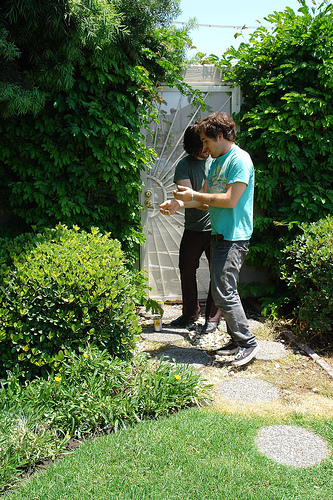

In [ ]:
display(im)

In [ ]:
import cv2
img = cv2.imread(all_img_name_vector[0])
#crop_img = img[y:y+h, x:x+w]
cv2.imshow(img)
cv2.waitKey(0)

In [ ]:
def data_limiter(num,total_captions,all_img_name_vector):
  train_captions, img_name_vector = shuffle(total_captions,all_img_name_vector,random_state=1)
  train_captions = train_captions[:num]
  img_name_vector = img_name_vector[:num]
  return train_captions,img_name_vector

In [ ]:
train_captions,img_name_vector = data_limiter(158915,all_captions,all_img_name_vector)

In [ ]:
print(f"len(all_img_name_vector) : {len(img_name_vector)}")
print(f"len(all_captions) : {len(train_captions)}")

len(all_img_name_vector) : 158915
len(all_captions) : 158915


In [ ]:
#Loading an image with (224,224,3) for passing to Encoder Resnet50
def load_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, (224, 224))
    return img, image_path

In [ ]:
#Using Pretrained Resnet50 as encoder and taking Input size of (224,224,3)
image_model = ResNet50(include_top=False,weights='imagenet',input_shape=(224, 224,3),pooling="avg")
new_input = image_model.input
hidden_layer = image_model.layers[-2].output

image_features_extract_model = tf.keras.Model(new_input, hidden_layer)

In [ ]:
image_features_extract_model.summary()

In [ ]:
image_model.summary()

In [ ]:
type(image_dataset)

tensorflow.python.data.ops.dataset_ops.BatchDataset

In [ ]:
type(img_name_vector)

list

In [ ]:
# Check libcudnn8 version
!apt-cache policy libcudnn8

# Install latest version
!apt install --allow-change-held-packages libcudnn8=8.4.1.50-1+cuda11.6

# Export env variables
!export PATH=/usr/local/cuda-11.4/bin${PATH:+:${PATH}}
!export LD_LIBRARY_PATH=/usr/local/cuda-11.4/lib64:$LD_LIBRARY_PATH
!export LD_LIBRARY_PATH=/usr/local/cuda-11.4/include:$LD_LIBRARY_PATH
!export LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/usr/local/cuda/extras/CUPTI/lib64

# Install tensorflow
!pip install tflite-model-maker==0.4.0
!pip uninstall -y tensorflow && pip install -q tensorflow==2.9.1
!pip install pycocotools==2.0.4
!pip install opencv-python-headless==4.6.0.66

In [ ]:
img_name_vector

In [ ]:
# Get unique images
encode_train = sorted(set(img_name_vector))

# Batch size 16
image_dataset = tf.data.Dataset.from_tensor_slices(encode_train)
image_dataset = image_dataset.map(
  load_image, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(16)
#Building Image feature vector using Resnet50 Encoder
for img,path in tqdm(image_dataset):
#   print(img,path)
#   break
  batch_features = image_features_extract_model(img)
  #print("shape",batch_features.shape)
  #print("batch_features.shape[0]",batch_features.shape[0])
  #print("batch_features.shape[3]",batch_features.shape[2])
  batch_features = tf.reshape(batch_features,
                              (batch_features.shape[0], -1, batch_features.shape[3]))

  for bf, p in zip(batch_features, path):
    path_of_feature = p.numpy().decode("utf-8")
    np.save(path_of_feature, bf.numpy())

100%|██████████| 1987/1987 [03:31<00:00,  9.39it/s]


In [ ]:
!pip install tensorflow==2.8
!apt install --allow-change-held-packages libcudnn8=8.1.0.77-1+cuda11.2

Setting up libcudnn8 (8.1.0.77-1+cuda11.2) ...


In [ ]:
for img1, path1 in tqdm(image_dataset):
  batch_features1 = image_features_extract_model(img1)
  print("shape",batch_features1.shape)
  print("batch_features.shape[0]",batch_features1.shape[0])
  print("batch_features.shape[1]",batch_features1.shape[1])
  print("batch_features.shape[2]",batch_features1.shape[2])
  print("batch_features.shape[3]",batch_features1.shape[3])
  batch_features2 = tf.reshape(batch_features1,
                              (batch_features1.shape[0], -1, batch_features1.shape[3]))
  print("shape",batch_features2.shape)
  print("batch_features2.shape[0]",batch_features2.shape[0])
  print("batch_features2.shape[1]",batch_features2.shape[1])
  print("batch_features2.shape[2]",batch_features2.shape[2])
  #print("batch_features2.shape[3]",batch_features2.shape[3])
  break

  0%|          | 0/1987 [00:00<?, ?it/s]

shape (16, 7, 7, 2048)
batch_features.shape[0] 16
batch_features.shape[1] 7
batch_features.shape[2] 7
batch_features.shape[3] 2048
shape (16, 49, 2048)
batch_features2.shape[0] 16
batch_features2.shape[1] 49
batch_features2.shape[2] 2048


### Preprocess and tokenize the captions

In [ ]:
top_k = 5000

In [ ]:
#Building a Word embedding for top 5000 words in the captions
tokenizer = tf.keras.preprocessing.text.Tokenizer(num_words=top_k,
                                                  oov_token="<unk>",
                                                  filters='!"#$%&()*+.,-/:;=?@[\]^_`{|}~ ')
tokenizer.fit_on_texts(train_captions)
train_seqs = tokenizer.texts_to_sequences(train_captions)

In [ ]:
tokenizer.word_index['<pad>'] = 0
tokenizer.index_word[0] = '<pad>'

In [ ]:
train_seqs = tokenizer.texts_to_sequences(train_captions)

In [ ]:
from pickle import dump,load

In [ ]:
pkl_tokenizer_file="/content/drive/MyDrive/Project Files/Pickle/encoded_tokenizer.pkl"

In [ ]:
# Save the tokenizer train features to disk
with open(pkl_tokenizer_file, "wb") as encoded_pickle:
    dump(tokenizer, encoded_pickle)


In [ ]:
cap_vector = tf.keras.preprocessing.sequence.pad_sequences(train_seqs, padding='post')

In [ ]:
cap_vector.shape # Maximum number of words in a sentence is 33 (in the captions dataset)

(158915, 74)

### Split the data into training and testing

In [ ]:
img_name_train, img_name_val, cap_train, cap_val = train_test_split(img_name_vector,
                                                                    cap_vector,
                                                                    test_size=0.2,
                                                                    random_state=0)

In [ ]:
len(img_name_train), len(cap_train), len(img_name_val), len(cap_val)

(127132, 127132, 31783, 31783)

In [ ]:
img_name_train, img_name_train2, cap_train, cap_train2 = train_test_split(img_name_train,
                                                                    cap_train,
                                                                    test_size=0.5,
                                                                    random_state=0)

In [ ]:
len(img_name_train), len(cap_train), len(img_name_val), len(cap_val)

(63566, 63566, 31783, 31783)

### Create a tf.data dataset for training

In [ ]:
BATCH_SIZE = 128
BUFFER_SIZE = 1000
num_steps = len(img_name_train) // BATCH_SIZE

In [ ]:
def map_func(img_name, cap):
  img_tensor = np.load(img_name.decode('utf-8')+'.npy')
  return img_tensor, cap

In [ ]:
# Check what is this ?
dataset = tf.data.Dataset.from_tensor_slices((img_name_train, cap_train))

# Use map to load the numpy files in parallel
dataset = dataset.map(lambda item1, item2: tf.numpy_function(
          map_func, [item1, item2], [tf.float32, tf.int32]),
          num_parallel_calls=tf.data.experimental.AUTOTUNE)

# Shuffle and batch
dataset = dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

In [ ]:
# Check what is this ?
dataset = tf.data.Dataset.from_tensor_slices((img_name_train, cap_train))

# Use map to load the numpy files in parallel
dataset = dataset.map(lambda item1, item2: tf.numpy_function(
          map_func, [item1, item2], [tf.float32, tf.int32]),
          num_parallel_calls=tf.data.experimental.AUTOTUNE)

# Shuffle and batch
dataset = dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

In [ ]:
def get_angles(pos, i, d_model):
   angle_rates = 1 / np.power(10000, (2 * (i//2)) / np.float32(d_model))
   return pos * angle_rates

In [ ]:
# Position encoding for 1d vectors ( Word embedding)
def positional_encoding_1d(position, d_model):
  angle_rads = get_angles(np.arange(position)[:, np.newaxis],
                          np.arange(d_model)[np.newaxis, :],
                          d_model)
  
  # apply sin to even indices in the array; 2i
  angle_rads[:, 0::2] = np.sin(angle_rads[:, 0::2])
  
  # apply cos to odd indices in the array; 2i+1
  angle_rads[:, 1::2] = np.cos(angle_rads[:, 1::2])
    
  pos_encoding = angle_rads[np.newaxis, ...]
    
  return tf.cast(pos_encoding, dtype=tf.float32)

In [ ]:
# Position encoding for 2d vectors (image)
#Input (Batch Size, H*W , Dense layer from Encoder)
def positional_encoding_2d(row,col,d_model):
  assert d_model % 2 == 0
  # first d_model/2 encode row embedding and second d_model/2 encode column embedding
  row_pos = np.repeat(np.arange(row),col)[:,np.newaxis]
  col_pos = np.repeat(np.expand_dims(np.arange(col),0),row,axis=0).reshape(-1,1)
  angle_rads_row = get_angles(row_pos,np.arange(d_model//2)[np.newaxis,:],d_model//2)
  angle_rads_col = get_angles(col_pos,np.arange(d_model//2)[np.newaxis,:],d_model//2)
  #apply sin and cos to odd and even indices resp.
  angle_rads_row[:, 0::2] = np.sin(angle_rads_row[:, 0::2])
  angle_rads_row[:, 1::2] = np.cos(angle_rads_row[:, 1::2])
  angle_rads_col[:, 0::2] = np.sin(angle_rads_col[:, 0::2])
  angle_rads_col[:, 1::2] = np.cos(angle_rads_col[:, 1::2])
  pos_encoding = np.concatenate([angle_rads_row,angle_rads_col],axis=1)[np.newaxis, ...]

  return tf.cast(pos_encoding, dtype=tf.float32)


In [ ]:
def create_padding_mask(seq):
  seq = tf.cast(tf.math.equal(seq, 0), tf.float32)
  
  # add extra dimensions to add the padding
  # to the attention logits.
  return seq[:, tf.newaxis, tf.newaxis, :]  # (batch_size, 1, 1, seq_len)

In [ ]:
def create_look_ahead_mask(size):
  mask = 1 - tf.linalg.band_part(tf.ones((size, size)), -1, 0)
  return mask  # (seq_len, seq_len)

In [ ]:
# This block build weights for Q - Query , K - Key , V - Value for the 8 heads
def scaled_dot_product_attention(q, k, v, mask):
  """Calculate the attention weights.
  q, k, v must have matching leading dimensions.
  k, v must have matching penultimate dimension, i.e.: seq_len_k = seq_len_v.
  The mask has different shapes depending on its type(padding or look ahead) 
  but it must be broadcastable for addition.
  
  Args:
    q: query shape == (..., seq_len_q, depth)
    k: key shape == (..., seq_len_k, depth)
    v: value shape == (..., seq_len_v, depth_v)
    mask: Float tensor with shape broadcastable 
          to (..., seq_len_q, seq_len_k). Defaults to None.
    
  Returns:
    output, attention_weights
  """

  matmul_qk = tf.matmul(q, k, transpose_b=True)  # (..., seq_len_q, seq_len_k)
  
  # scale matmul_qk
  dk = tf.cast(tf.shape(k)[-1], tf.float32)
  scaled_attention_logits = matmul_qk / tf.math.sqrt(dk)

  # add the mask to the scaled tensor.
  if mask is not None:
    scaled_attention_logits += (mask * -1e9)  #adding -Inf where mask is 1 s.t. value get ignored in softmax

  # softmax is normalized on the last axis (seq_len_k) so that the scores
  # add up to 1.
  attention_weights = tf.nn.softmax(scaled_attention_logits, axis=-1)  # (..., seq_len_q, seq_len_k)

  output = tf.matmul(attention_weights, v)  # (..., seq_len_q, depth_v)

  return output, attention_weights

In [ ]:
""" This class build Multihead attention layer with number of heads passed ( 8 as per paper) and builds
Weigth for q - Query , k - Key , v - Value  . Weights matrix will be as many as number of heads """
class MultiHeadAttention(tf.keras.layers.Layer):
  def __init__(self, d_model, num_heads):
    super(MultiHeadAttention, self).__init__()
    self.num_heads = num_heads
    self.d_model = d_model
    
    assert d_model % self.num_heads == 0
    
    self.depth = d_model // self.num_heads
    
    self.wq = tf.keras.layers.Dense(d_model)
    self.wk = tf.keras.layers.Dense(d_model)
    self.wv = tf.keras.layers.Dense(d_model)
    
    self.dense = tf.keras.layers.Dense(d_model)
        
  def split_heads(self, x, batch_size):
    """Split the last dimension into (num_heads, depth).
    Transpose the result such that the shape is (batch_size, num_heads, seq_len, depth)
    """
    #
    x = tf.reshape(x, (batch_size, -1, self.num_heads, self.depth))
    return tf.transpose(x, perm=[0, 2, 1, 3])
    
  def call(self, v, k, q, mask=None):
    batch_size = tf.shape(q)[0]
    
    q = self.wq(q)  # (batch_size, seq_len, d_model)
    k = self.wk(k)  # (batch_size, seq_len, d_model)
    v = self.wv(v)  # (batch_size, seq_len, d_model)
    
    q = self.split_heads(q, batch_size)  # (batch_size, num_heads, seq_len_q, depth)
    k = self.split_heads(k, batch_size)  # (batch_size, num_heads, seq_len_k, depth)
    v = self.split_heads(v, batch_size)  # (batch_size, num_heads, seq_len_v, depth)
    
    # scaled_attention.shape == (batch_size, num_heads, seq_len_q, depth)
    # attention_weights.shape == (batch_size, num_heads, seq_len_q, seq_len_k)
    scaled_attention, attention_weights = scaled_dot_product_attention(
        q, k, v, mask)
    
    scaled_attention = tf.transpose(scaled_attention, perm=[0, 2, 1, 3])  # (batch_size, seq_len_q, num_heads, depth)

    concat_attention = tf.reshape(scaled_attention, 
                                  (batch_size, -1, self.d_model))  # (batch_size, seq_len_q, d_model)

    output = self.dense(concat_attention)  # (batch_size, seq_len_q, d_model)
        
    return output, attention_weights

In [ ]:
# fucntion converts the Feedforward layer vector to Model size ( 512 in this case)
def point_wise_feed_forward_network(d_model, dff):
  return tf.keras.Sequential([
      tf.keras.layers.Dense(dff, activation='relu'),  # (batch_size, seq_len, dff)
      tf.keras.layers.Dense(d_model)  # (batch_size, seq_len, d_model)
  ])

In [ ]:
""" Within this block the Multihead attention layer is built to get weights for q,k,v 
 The output of MHA is passed to FFN and normalization"""
class EncoderLayer(tf.keras.layers.Layer):
  def __init__(self, d_model, num_heads, dff, rate=0.1):
    super(EncoderLayer, self).__init__()

    self.mha = MultiHeadAttention(d_model, num_heads)
    self.ffn = point_wise_feed_forward_network(d_model, dff)

    self.layernorm1 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
    self.layernorm2 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
    
    self.dropout1 = tf.keras.layers.Dropout(rate)
    self.dropout2 = tf.keras.layers.Dropout(rate)
    
  def call(self, x, training, mask=None):

    attn_output, _ = self.mha(x, x, x, mask)  # (batch_size, input_seq_len, d_model)
    attn_output = self.dropout1(attn_output, training=training)
    out1 = self.layernorm1(x + attn_output)  # (batch_size, input_seq_len, d_model)
    
    ffn_output = self.ffn(out1)  # (batch_size, input_seq_len, d_model)
    ffn_output = self.dropout2(ffn_output, training=training)
    out2 = self.layernorm2(out1 + ffn_output)  # (batch_size, input_seq_len, d_model)
    
    return out2

In [ ]:
""" Decoder layer will build two MHA 
1. MHA1 = Word Embedding + Position Encoding
2. MHA2 = MHA1 + MHA_ecoded( image)
Then it creates a Feedforward layer with d_model channels ( 512 here)
Returns  batch normalized output with MHA1 and MHA2 Attention weights"""
class DecoderLayer(tf.keras.layers.Layer):
  def __init__(self, d_model, num_heads, dff, rate=0.1):
    super(DecoderLayer, self).__init__()

    self.mha1 = MultiHeadAttention(d_model, num_heads)
    self.mha2 = MultiHeadAttention(d_model, num_heads)

    self.ffn = point_wise_feed_forward_network(d_model, dff)
 
    self.layernorm1 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
    self.layernorm2 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
    self.layernorm3 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
    
    self.dropout1 = tf.keras.layers.Dropout(rate)
    self.dropout2 = tf.keras.layers.Dropout(rate)
    self.dropout3 = tf.keras.layers.Dropout(rate)
    
    
  def call(self, x, enc_output, training, 
           look_ahead_mask=None, padding_mask=None):
    # enc_output.shape == (batch_size, input_seq_len, d_model)

    # using look ahead mask so that during self attention current query dont consider future token
    attn1, attn_weights_block1 = self.mha1(x, x, x, look_ahead_mask)  # (batch_size, target_seq_len, d_model)
    attn1 = self.dropout1(attn1, training=training)
    out1 = self.layernorm1(attn1 + x)
    
    # use padding mask to avoid padded values of both enc_output and dec_input
    attn2, attn_weights_block2 = self.mha2(
        enc_output, enc_output, out1, padding_mask)  # (batch_size, target_seq_len, d_model)
    attn2 = self.dropout2(attn2, training=training)
    out2 = self.layernorm2(attn2 + out1)  # (batch_size, target_seq_len, d_model)
    
    ffn_output = self.ffn(out2)  # (batch_size, target_seq_len, d_model)
    ffn_output = self.dropout3(ffn_output, training=training)
    out3 = self.layernorm3(ffn_output + out2)  # (batch_size, target_seq_len, d_model)
    
    return out3, attn_weights_block1, attn_weights_block2

In [ ]:
import os,shutil

In [ ]:
src='/content/drive/MyDrive/Project Files/flickr30k_1/'
dst='/content/sample_data/Flickr30k_1'

In [ ]:
shutil.copytree(src, dst)

'/content/sample_data/Flickr30k_1'

In [ ]:
src='/content/drive/MyDrive/Project Files/flickr30k_2'
dst='/content/sample_data/Flickr30k_2'
shutil.copytree(src, dst)

In [ ]:
!cp -r /content/drive/MyDrive/data /content/data

In [ ]:
!pip install --upgrade --no-cache-dir gdown

In [ ]:
!cd /

In [ ]:
! gdown --id 1bYCzjGFUqW6Kf741wEHepv6vQIzCsMS-

/usr/local/lib/python3.7/dist-packages/gdown/cli.py:131: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  category=FutureWarning,
Access denied with the following error:

 	Cannot retrieve the public link of the file. You may need to change
	the permission to 'Anyone with the link', or have had many accesses. 

You may still be able to access the file from the browser:

	 https://drive.google.com/uc?id=1bYCzjGFUqW6Kf741wEHepv6vQIzCsMS- 



In [ ]:
from google.colab import files

with open('example.txt', 'w') as f:
  f.write('some content')

files.download('example.txt')

In [ ]:
# Import PyDrive and associated libraries.
# This only needs to be done once per notebook.
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

# Authenticate and create the PyDrive client.
# This only needs to be done once per notebook.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

# Download a file based on its file ID.
#
# A file ID looks like: laggVyWshwcyP6kEI-y_W3P8D26sz
file_id = '1bYCzjGFUqW6Kf741wEHepv6vQIzCsMS-'
downloaded = drive.CreateFile({'id': file_id})

In [ ]:
downloaded

GoogleDriveFile({'id': '1bYCzjGFUqW6Kf741wEHepv6vQIzCsMS-'})

In [ ]:
print(downloaded.content)

None


In [ ]:
src

'/content/drive/MyDrive/Project Files/flickr30k_2/'

In [ ]:
%cp -r "/content/drive/MyDrive/Project Files/flickr30k_4" "/content/sample_data/flickr30k_4"

^C


In [ ]:
!rm -rf /content/sample_data/Flickr30k_4

In [ ]:
%cp -av "/content/drive/MyDrive/Project Files/flickr30k_2" "/content/sample_data/Flickr30k_2"

In [ ]:
%cp -av "/content/drive/MyDrive/Project Files/flickr30k_3" "/content/sample_data/Flickr30k_3"

In [ ]:
%cp -av "/content/drive/MyDrive/Project Files/flickr30k_4" "/content/sample_data/Flickr30k_4"

In [ ]:
 src='/content/drive/MyDrive/Project /flickr30k_4/'
dst='/content/sample_data/Flickr30k_4'
shutil.copytree(src, dst)

num_layer = 4
d_model = 512
dff = 2048
num_heads = 8
row_size = 7
col_size = 7
target_vocab_size = top_k + 1 # top_k = 5000
dropout_rate = 0.1

In [ ]:
"""Encoder to the following
Input - Takes Image Feature vector from Resnet50 
Adds position encoding to Image vector , builds an attention vector for the image
Output - updated Image vector with attention calculated  
 """
class Encoder(tf.keras.layers.Layer):
  def __init__(self, num_layers, d_model, num_heads, dff,
               row_size,col_size,rate=0.1):
    super(Encoder, self).__init__()

    self.d_model = d_model
    self.num_layers = num_layers
    
    self.embedding = tf.keras.layers.Dense(self.d_model,activation='relu')
    self.pos_encoding = positional_encoding_2d(row_size,col_size, 
                                            self.d_model)
    
    
    self.enc_layers = [EncoderLayer(d_model, num_heads, dff, rate) 
                       for _ in range(num_layers)]
  
    self.dropout = tf.keras.layers.Dropout(rate)
        
  def call(self, x, training, mask=None):
    # shape(x) = (batch_size,seq_len(H*W),features)
    seq_len = tf.shape(x)[1]
    
    # adding embedding and position encoding.
    x = self.embedding(x)  # (batch_size, input_seq_len(H*W), d_model)
    x += self.pos_encoding[:, :seq_len, :]

    x = self.dropout(x, training=training)
    
    for i in range(self.num_layers):
      x = self.enc_layers[i](x, training, mask) # Encode layer is execture 4 times ?
    
    return x  # (batch_size, input_seq_len, d_model)

In [ ]:
""" Decoder take the Word emdedding as input adds the Postion encoding to it and build a new embedding
New embedding is passed to the Decoder layer . Two key calcualtions happen in DecoderLayer
1. Calculation of Attention weights for New Word embedding 
2. Calculation of attention weights for Word Embedding + Attention Image ( out of Encoded layer)
This is passed to a feed forward output is derived"""
class Decoder(tf.keras.layers.Layer):
  def __init__(self, num_layers, d_model, num_heads, dff, target_vocab_size,
               maximum_position_encoding, rate=0.1):
    super(Decoder, self).__init__()

    self.d_model = d_model
    self.num_layers = num_layers
    
    self.embedding = tf.keras.layers.Embedding(target_vocab_size, d_model)
    self.pos_encoding = positional_encoding_1d(maximum_position_encoding, d_model)
    
    self.dec_layers = [DecoderLayer(d_model, num_heads, dff, rate) 
                       for _ in range(num_layers)]
    self.dropout = tf.keras.layers.Dropout(rate)
    
  def call(self, x, enc_output, training, 
           look_ahead_mask=None, padding_mask=None):

    seq_len = tf.shape(x)[1]
    attention_weights = {}
    
    x = self.embedding(x)  # (batch_size, target_seq_len, d_model)
    x *= tf.math.sqrt(tf.cast(self.d_model, tf.float32))# WHY ?
    x += self.pos_encoding[:, :seq_len, :]
    
    x = self.dropout(x, training=training)

    for i in range(self.num_layers):
      x, block1, block2 = self.dec_layers[i](x, enc_output, training,
                                             look_ahead_mask, padding_mask)
      
      attention_weights['decoder_layer{}_block1'.format(i+1)] = block1
      attention_weights['decoder_layer{}_block2'.format(i+1)] = block2
    
    # x.shape == (batch_size, target_seq_len, d_model)
    return x, attention_weights

In [ ]:
""" This class build Encoder , Decoder and Encoder+ decoder inputs and passes build a layer size Vocab
The out of this class would a predicted """
class Transformer(tf.keras.Model):
#_int_(num_layers = 4, d_model=512 , num_heads = 8, dff=2048,row_size=7,col_soze = 7, target_vocab_size = 5000+1 
#,max_pos_encoding = vocab_size,rate=0.1 )
  def __init__(self, num_layers, d_model, num_heads, dff,row_size,col_size, 
               target_vocab_size,max_pos_encoding, rate=0.1):
    super(Transformer, self).__init__()

    self.encoder = Encoder(num_layers, d_model, num_heads, dff,row_size,col_size, rate)

    self.decoder = Decoder(num_layers, d_model, num_heads, dff, 
                           target_vocab_size,max_pos_encoding, rate)

    self.final_layer = tf.keras.layers.Dense(target_vocab_size)
# inp = Image tensor , tar = Word embedding , training = True 
  def call(self, inp, tar, training,look_ahead_mask=None, dec_padding_mask=None,enc_padding_mask=None):

    enc_output = self.encoder(inp, training, enc_padding_mask)  # (batch_size, inp_seq_len, d_model)
    
    # dec_output.shape == (batch_size, tar_seq_len, d_model)
    dec_output, attention_weights = self.decoder(
        tar, enc_output, training, look_ahead_mask, dec_padding_mask)
    
    final_output = self.final_layer(dec_output)  # (batch_size, tar_seq_len, target_vocab_size)
    
    return final_output, attention_weights

In [ ]:
num_layer = 4
d_model = 512
dff = 2048
num_heads = 8
row_size = 7
col_size = 7
target_vocab_size = top_k + 1 # top_k = 5000
dropout_rate = 0.1

In [ ]:
#transformer = Transformer(num_layer,d_model,num_heads,dff,row_size,col_size,target_vocab_size,max_pos_encoding=target_vocab_size,rate=dropout_rate)

In [ ]:
print (target_vocab_size)

5001


In [ ]:
np.arange(target_vocab_size)

array([   0,    1,    2, ..., 4998, 4999, 5000])

In [ ]:
# Temp code
angle_check = get_angles(np.arange(target_vocab_size)[:, np.newaxis],
                          np.arange(512)[np.newaxis, :],
                          512)
print (angle_check.shape)
print(type(angle_check))

(5001, 512)
<class 'numpy.ndarray'>


In [ ]:
# Temp code
# apply sin to even indices in the array; 2i
angle_check[:, 0::2] = np.sin(angle_check[:, 0::2])
print(angle_check.shape)
# apply cos to odd indices in the array; 2i+1
angle_check[:, 1::2] = np.cos(angle_check[:, 1::2])
pos_encoding_check = angle_check[np.newaxis, ...]
print(pos_encoding_check.shape)

(5001, 512)
(1, 5001, 512)


In [ ]:
  # Temp code
  row_pos1 = np.repeat(np.arange(8),8)[:,np.newaxis]
  print("row_pos1", row_pos1.shape)
  col_pos1 = np.repeat(np.expand_dims(np.arange(8),0),8,axis=0).reshape(-1,1)
  print("row_pos1", col_pos1.shape)
  angle_rads_row1 = get_angles(row_pos1,np.arange(512//2)[np.newaxis,:],d_model//2)
  print("angle_rads_row1", angle_rads_row1.shape)
  angle_rads_col1 = get_angles(col_pos1,np.arange(512//2)[np.newaxis,:],d_model//2)
  print("angle_rads_col1", angle_rads_col1.shape)
  #apply sin and cos to odd and even indices resp.
  angle_rads_row1[:, 0::2] = np.sin(angle_rads_row1[:, 0::2])
  angle_rads_row1[:, 1::2] = np.cos(angle_rads_row1[:, 1::2])
  print("angle_rads_row1-1", angle_rads_row1.shape)
  print("angle_rads_col1-1", angle_rads_col1.shape)
  angle_rads_col1[:, 0::2] = np.sin(angle_rads_col1[:, 0::2])
  angle_rads_col1[:, 1::2] = np.cos(angle_rads_col1[:, 1::2])
  print("angle_rads_row1-2", angle_rads_row1.shape)
  print("angle_rads_col1-2", angle_rads_col1.shape)
  pos_encoding1 = np.concatenate([angle_rads_row1,angle_rads_col1],axis=1)[np.newaxis, ...]
  print("pos_encoding1", pos_encoding1.shape)

row_pos1 (64, 1)
row_pos1 (64, 1)
angle_rads_row1 (64, 256)
angle_rads_col1 (64, 256)
angle_rads_row1-1 (64, 256)
angle_rads_col1-1 (64, 256)
angle_rads_row1-2 (64, 256)
angle_rads_col1-2 (64, 256)
pos_encoding1 (1, 64, 512)


In [ ]:
# What is this?
class CustomSchedule(tf.keras.optimizers.schedules.LearningRateSchedule):
  def __init__(self, d_model, warmup_steps=4000):
    super(CustomSchedule, self).__init__()
    
    self.d_model = d_model
    self.d_model = tf.cast(self.d_model, tf.float32)

    self.warmup_steps = warmup_steps
    
  def __call__(self, step):
    arg1 = tf.math.rsqrt(step)
    arg2 = step * (self.warmup_steps ** -1.5)
    
    return tf.math.rsqrt(self.d_model) * tf.math.minimum(arg1, arg2)

In [ ]:
learning_rate = CustomSchedule(d_model)

optimizer = tf.keras.optimizers.Adam(learning_rate, beta_1=0.9, beta_2=0.98, 
                                     epsilon=1e-9)

In [ ]:
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(
    from_logits=True, reduction='none')

In [ ]:
def loss_function(real, pred):
  mask = tf.math.logical_not(tf.math.equal(real, 0))
  loss_ = loss_object(real, pred)

  mask = tf.cast(mask, dtype=loss_.dtype)
  loss_ *= mask
  
  return tf.reduce_sum(loss_)/tf.reduce_sum(mask)

In [ ]:
train_loss = tf.keras.metrics.Mean(name='train_loss')
train_accuracy = tf.keras.metrics.SparseCategoricalAccuracy(
    name='train_accuracy')

In [ ]:
transformer = Transformer(num_layer,d_model,num_heads,dff,row_size,col_size,target_vocab_size,max_pos_encoding=target_vocab_size,rate=dropout_rate)

In [ ]:
def create_masks_decoder(tar):
  look_ahead_mask = create_look_ahead_mask(tf.shape(tar)[1])
  dec_target_padding_mask = create_padding_mask(tar)
  combined_mask = tf.maximum(dec_target_padding_mask, look_ahead_mask)
  return combined_mask

In [ ]:
# @tf.function
#Image tensor and correspoding caption is passed to train_step
def train_step(img_tensor, tar):
  tar_inp = tar[:, :-1] ## all word embedding except the <end>
  tar_real = tar[:, 1:] ## all word embedding except the <start>
  
  dec_mask = create_masks_decoder(tar_inp)# Setting all embeddding for future words to 0 and taking only previous words
  
  with tf.GradientTape() as tape:
    predictions, _ = transformer(img_tensor, tar_inp, 
                                 True,  
                                 dec_mask)
    loss = loss_function(tar_real, predictions)

  gradients = tape.gradient(loss, transformer.trainable_variables)    
  optimizer.apply_gradients(zip(gradients, transformer.trainable_variables))
  
  train_loss(loss)
  train_accuracy(tar_real, predictions)

In [ ]:
for (batch1, (img_tensor1, tar1)) in enumerate(dataset):
     print("img_tensor1", img_tensor1.shape)
     #print(img_tensor1,tar1)
     break

img_tensor1 (64, 49, 2048)


In [ ]:
for (batch1, (img_tensor1, tar1)) in enumerate(dataset):
     train_step(img_tensor1, tar1)
     break

In [ ]:
train_step(img_tensor, tar)

In [ ]:
#@title Default title text
#Epochs = 50 , Data set returns Image and All captions for images which are passed to train_step function
for epoch in range(10):
  start = time.time()
  
  train_loss.reset_states()
  train_accuracy.reset_states()  
  for (batch, (img_tensor, tar)) in enumerate(dataset):
    tf.keras.backend.clear_session()  
    train_step(img_tensor, tar)
    
    if batch % 50 == 0:
      print ('Epoch {} Batch {} Loss {:.4f} Accuracy {:.4f}'.format(
          epoch + 1, batch, train_loss.result(), train_accuracy.result()))
      
    
  print ('Epoch {} Loss {:.4f} Accuracy {:.4f}'.format(epoch + 1, 
                                                train_loss.result(), 
                                                train_accuracy.result()))

  print ('Time taken for 1 epoch: {} secs\n'.format(time.time() - start))

Epoch 1 Batch 0 Loss 8.6391 Accuracy 0.0001


KeyboardInterrupt: ignored

In [ ]:
transformer.built=True

In [ ]:
transformer.save_weights('/image_caption_transformer_resnet50.h5')#,save_format='tf')

In [ ]:
transformer.save_weights('/image_caption_transformer_resnet50_18Aug.h5')#,save_format='tf')

In [ ]:
transformer.load_weights('/image_caption_transformer_resnet50_18Aug.h5')
#,by_name=True)

In [ ]:
def evaluate(image):

  temp_input = tf.expand_dims(load_image(image)[0], 0)
  img_tensor_val = image_features_extract_model(temp_input)
  img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))
  
  start_token = tokenizer.word_index['<start>']
  end_token = tokenizer.word_index['<end>']
   
  #decoder input is start token.
  decoder_input = [start_token]
  output = tf.expand_dims(decoder_input, 0) #tokens
  result = [] #word list

  for i in range(100):
      dec_mask = create_masks_decoder(output)
  
      # predictions.shape == (batch_size, seq_len, vocab_size)
      predictions, attention_weights = transformer(img_tensor_val,output,False,dec_mask)
      
      # select the last word from the seq_len dimension
      predictions = predictions[: ,-1:, :]  # (batch_size, 1, vocab_size)

      predicted_id = tf.cast(tf.argmax(predictions, axis=-1), tf.int32)
      # return the result if the predicted_id is equal to the end token
      if predicted_id == end_token:
          return result,tf.squeeze(output, axis=0), attention_weights
      # concatentate the predicted_id to the output which is given to the decoder
      # as its input.
      result.append(tokenizer.index_word[int(predicted_id)])
      output = tf.concat([output, predicted_id], axis=-1)

  return result,tf.squeeze(output, axis=0), attention_weights

BLEU-1 score: 39.77063630286087
BLEU-2 score: 8.898688699301466e-153
BLEU-3 score: 1.7967885069168788e-183
BLEU-4 score: 1.3310910140277609e-229
Real Caption: <unk> is on display in the middle of public square
Predicted Caption: man in blue shirt is standing on the street


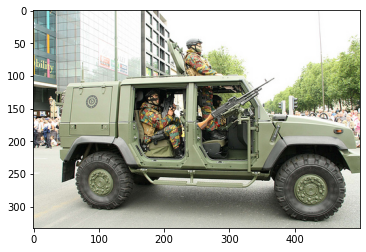

In [ ]:
start_token = tokenizer.word_index['<start>']
end_token = tokenizer.word_index['<end>']
# select random image from validation data
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_weights = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

#remove <end> from result         
result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption
score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-1 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-4 score: {score*100}")

print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)


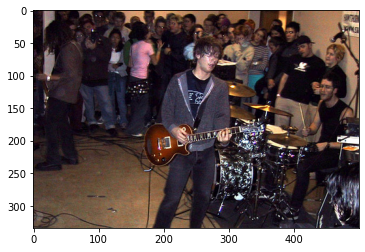

Real Caption: band plays with the guitar in front for crowd
Predicted Caption: group of people are gathered around fire
BLEU-1 score: 0
BLEU-2 score: 0
BLEU-3 score: 0
BLEU-4 score: 0


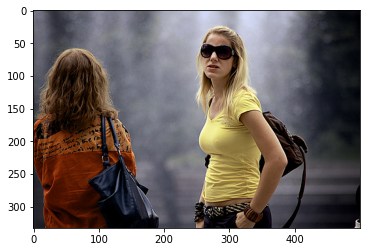

Real Caption: blond woman in yellow shirt standing by woman in an orange shirt
Predicted Caption: woman in black and white dress is standing in front of microphone
BLEU-1 score: 33.33333333333333
BLEU-2 score: 17.407765595569778
BLEU-3 score: 1.7727567490939188e-91
BLEU-4 score: 6.223629500679345e-153


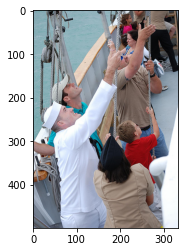

Real Caption: man in an aqua colored shirt sailor young boy wearing red shirt and some other people tug on ropes while standing on ship deck
Predicted Caption: group of people are sitting on bench
BLEU-1 score: 2.5189339817816414
BLEU-2 score: 7.029477144195254e-154
BLEU-3 score: 1.5504975174276478e-184
BLEU-4 score: 1.1742921079512431e-230


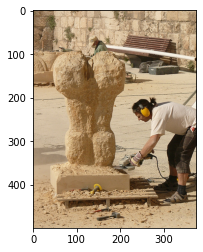

Real Caption: man is wearing yellow protective headphones while using circular saw to carve pieces away from tan stone sculpture
Predicted Caption: man in white shirt and black pants is playing with his arms in the air
BLEU-1 score: 10.916410041039759
BLEU-2 score: 4.4594642597023906e-153
BLEU-3 score: 1.1455904470567856e-183
BLEU-4 score: 9.013305912816874e-230


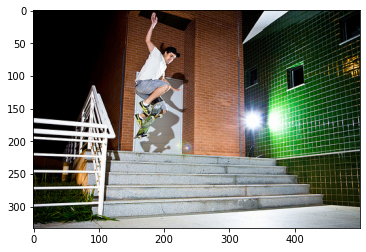

Real Caption: man in shorts and is skateboarding in midair down concrete stairs
Predicted Caption: man in black shirt and black pants is jumping off of the stairs
BLEU-1 score: 38.46153846153847
BLEU-2 score: 17.90287185098582
BLEU-3 score: 1.8028390283166976e-91
BLEU-4 score: 6.311514251575016e-153


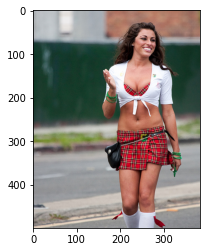

Real Caption: tilted kilt girl walking the street
Predicted Caption: woman in black and white dress is walking down the street
BLEU-1 score: 27.27272727272727
BLEU-2 score: 16.514456476895408
BLEU-3 score: 1.7175994813661398e-91
BLEU-4 score: 6.061838450024688e-153


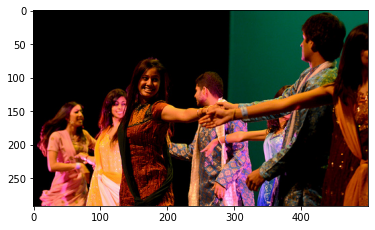

Real Caption: group of young women and men in exotic costumes perform dance
Predicted Caption: two girls in costumes are performing dance
BLEU-1 score: 24.202205228903967
BLEU-2 score: 5.51461944293045e-153
BLEU-3 score: 1.1216189750495802e-183
BLEU-4 score: 8.324264127738904e-230


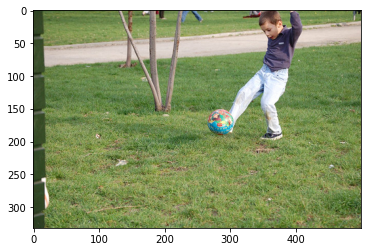

Real Caption: little boy kicking rubber ball
Predicted Caption: girl in blue shirt is jumping in the grass
BLEU-1 score: 0
BLEU-2 score: 0
BLEU-3 score: 0
BLEU-4 score: 0


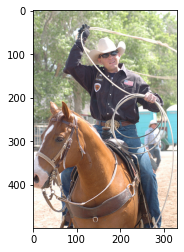

Real Caption: cowboy on horse is about to lasso something
Predicted Caption: man in cowboy hat is holding on to horse
BLEU-1 score: 55.55555555555556
BLEU-2 score: 1.1118237916213198e-152
BLEU-3 score: 2.14696471686284e-183
BLEU-4 score: 1.5728604687011317e-229


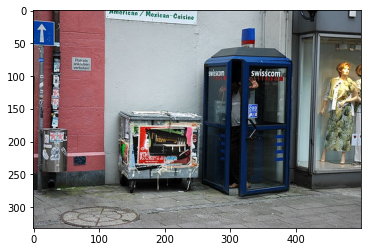

Real Caption: african american man with shopping bag standing in blue phone booth
Predicted Caption: woman in black shirt is standing outside of an apartment building
BLEU-1 score: 18.181818181818183
BLEU-2 score: 6.360494346864464e-153
BLEU-3 score: 1.5356698295026469e-183
BLEU-4 score: 1.1896457329133972e-229


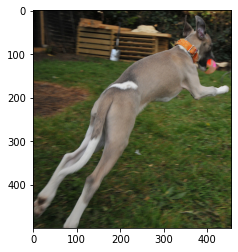

Real Caption: brown dog wearing an orange collar leaping to catch bright colored ball
Predicted Caption: black and white dog is playing with tennis ball
BLEU-1 score: 15.922918012750872
BLEU-2 score: 5.038498475779542e-153
BLEU-3 score: 1.168632815958936e-183
BLEU-4 score: 8.962731118674859e-230


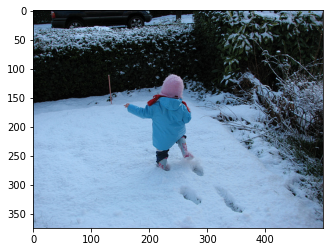

Real Caption: little girl in blue coat and pink hat makes tracks in the snow
Predicted Caption: young boy in blue snowsuit and blue pants is playing in the snow
BLEU-1 score: 46.15384615384615
BLEU-2 score: 33.96831102433788
BLEU-3 score: 25.481592515076173
BLEU-4 score: 3.908633169762327e-76


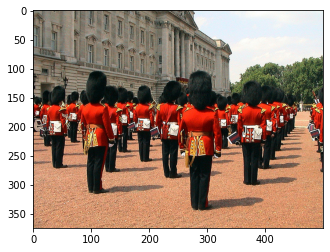

Real Caption: group of soldiers wearing big fuzzy black hats are standing in rows
Predicted Caption: group of people in bright orange vests and black pants are standing in front of an old building
BLEU-1 score: 33.33333333333333
BLEU-2 score: 24.253562503633297
BLEU-3 score: 18.604985196020532
BLEU-4 score: 3.0074186032008e-76


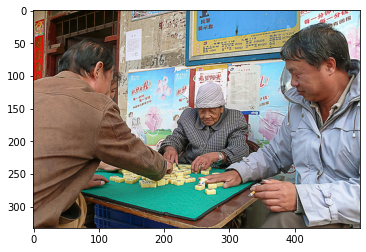

Real Caption: some older people are playing an ancient game
Predicted Caption: man in blue shirt is reading book while woman in white shirt is reading book
BLEU-1 score: 0
BLEU-2 score: 0
BLEU-3 score: 0
BLEU-4 score: 0


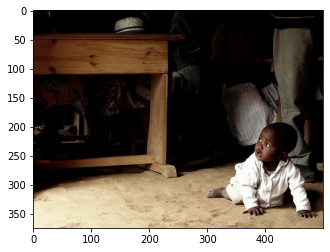

Real Caption: black baby is looking to his right
Predicted Caption: young boy in white shirt and blue pants is playing with an adult
BLEU-1 score: 7.6923076923076925
BLEU-2 score: 4.1371430671115044e-153
BLEU-3 score: 1.1863795531178766e-183
BLEU-4 score: 9.594503055152631e-230


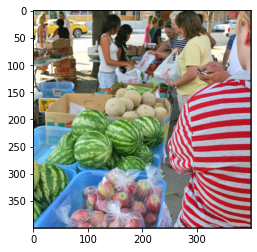

Real Caption: shoppers at an open air market bag fruits and vegetables there are bins of <unk> <unk> and apples in the foreground
Predicted Caption: group of people are gathered around fruit stand
BLEU-1 score: 4.922791880104851
BLEU-2 score: 1.4686343676243235e-153
BLEU-3 score: 3.327056134155667e-184
BLEU-4 score: 2.536674788921588e-230


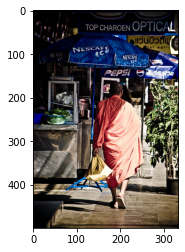

Real Caption: person in <unk> walks toward several blue outdoor umbrellas while carrying tan bag
Predicted Caption: man in blue shirt and black pants is standing in front of an open air market
BLEU-1 score: 12.500000000000004
BLEU-2 score: 5.273843307431706e-153
BLEU-3 score: 1.372396692566494e-183
BLEU-4 score: 1.0832677820940878e-229


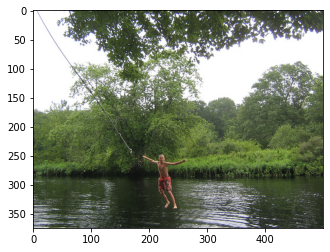

Real Caption: the man is dropping from swinging rope into calm river
Predicted Caption: man in red shirt is jumping into the water
BLEU-1 score: 39.77063630286087
BLEU-2 score: 8.898688699301466e-153
BLEU-3 score: 1.7967885069168788e-183
BLEU-4 score: 1.3310910140277609e-229


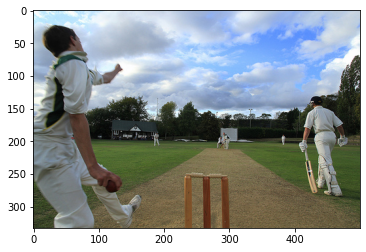

Real Caption: six men dressed in white clothing seem to be playing baseball on field with green grass on both sides
Predicted Caption: man in white shirt and black pants is jumping in the grass
BLEU-1 score: 13.950878644251178
BLEU-2 score: 8.41269635613876
BLEU-3 score: 9.074633178683692e-92
BLEU-4 score: 3.2319943940145725e-153


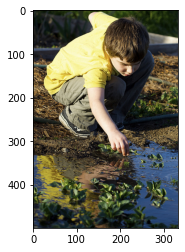

Real Caption: little boy <unk> plants growing in puddle of water
Predicted Caption: young boy in blue shirt and shorts is playing with his hands
BLEU-1 score: 16.666666666666668
BLEU-2 score: 6.08970970641905e-153
BLEU-3 score: 1.4961022763680928e-183
BLEU-4 score: 1.1640469867513693e-229


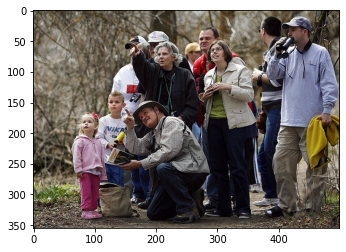

Real Caption: forest guide points something up to group of visitors
Predicted Caption: group of people are sitting on the grass in the park
BLEU-1 score: 18.181818181818183
BLEU-2 score: 13.483997249264846
BLEU-3 score: 1.5208785072510163e-91
BLEU-4 score: 5.477489369001354e-153


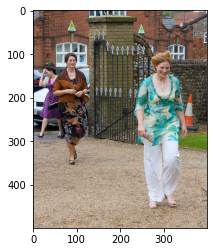

Real Caption: woman in white pants and floral top woman in dress with brown jacket and another woman in purple dress all <unk> somewhere as the wind blows
Predicted Caption: woman in blue shirt and black pants is walking down the street
BLEU-1 score: 12.975134329774907
BLEU-2 score: 6.060677025650216
BLEU-3 score: 5.902625854866919e-92
BLEU-4 score: 2.0492471437353754e-153


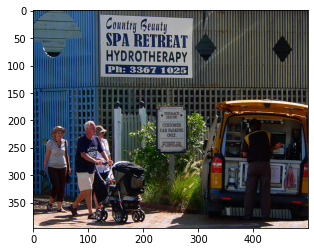

Real Caption: an older man wearing shorts and pushes baby stroller as he walks in front of two women wearing hats
Predicted Caption: man in blue shirt and woman in black shirt are sitting on bench
BLEU-1 score: 14.545688921462768
BLEU-2 score: 4.5166616683104505e-153
BLEU-3 score: 1.039720058462003e-183
BLEU-4 score: 7.959012597992964e-230


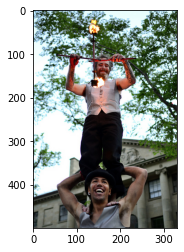

Real Caption: smiling man holding sticks and fire stands on the shoulders of another smiling man
Predicted Caption: young boy in blue shirt and black pants is jumping in the air
BLEU-1 score: 14.245555056035633
BLEU-2 score: 5.417616629968933e-153
BLEU-3 score: 1.3524629728545973e-183
BLEU-4 score: 1.0565078215140204e-229


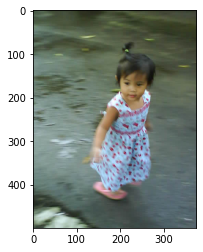

Real Caption: young asian girl wearing and flowered sundress runs down the street
Predicted Caption: little girl in pink and white striped shirt is running in the grass
BLEU-1 score: 23.076923076923077
BLEU-2 score: 7.165741990418252e-153
BLEU-3 score: 1.6495292825393885e-183
BLEU-4 score: 1.2627076138080563e-229


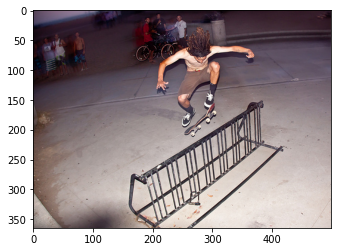

Real Caption: skateboarder jumping over bike rack in city
Predicted Caption: man in black shirt and black pants is jumping on trampoline
BLEU-1 score: 18.181818181818183
BLEU-2 score: 6.360494346864464e-153
BLEU-3 score: 1.5356698295026469e-183
BLEU-4 score: 1.1896457329133972e-229


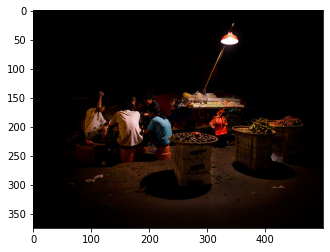

Real Caption: group of people sitting around playing cards
Predicted Caption: group of people are gathered around fire
BLEU-1 score: 57.14285714285714
BLEU-2 score: 43.643578047198474
BLEU-3 score: 37.519859868268625
BLEU-4 score: 5.395774370246973e-76


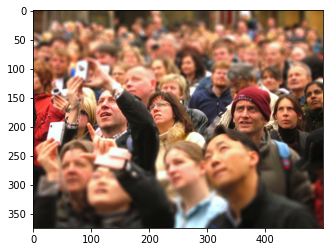

Real Caption: crowd of people stare up and take photos of something
Predicted Caption: group of people are gathered together in the street
BLEU-1 score: 19.885318151430436
BLEU-2 score: 14.91398861357283
BLEU-3 score: 1.5454595293390365e-91
BLEU-4 score: 5.449311673289858e-153


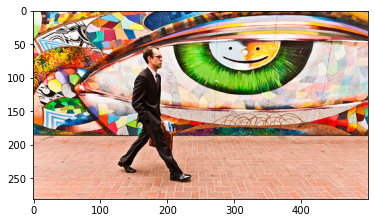

Real Caption: man in black suit passing by festive mural
Predicted Caption: man in black shirt is standing on the street
BLEU-1 score: 33.33333333333333
BLEU-2 score: 28.867513459481287
BLEU-3 score: 26.467700653516886
BLEU-4 score: 4.034282314146679e-76


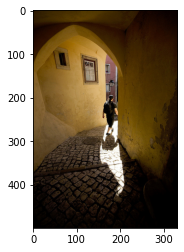

Real Caption: person in black clothing wearing backpack is walking down cobblestone pathway
Predicted Caption: man in black shirt and black pants is standing on the floor
BLEU-1 score: 25.0
BLEU-2 score: 15.075567228888179
BLEU-3 score: 1.6261759223357467e-91
BLEU-4 score: 5.791739854583281e-153


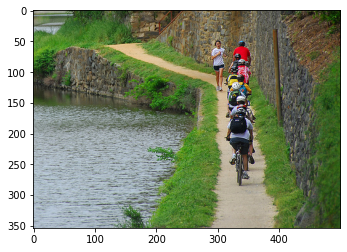

Real Caption: the seven boy are biking beside the lake
Predicted Caption: man in red shirt and black pants is walking down dirt path
BLEU-1 score: 0
BLEU-2 score: 0
BLEU-3 score: 0
BLEU-4 score: 0


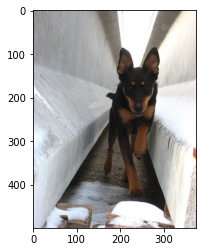

Real Caption: black and brown dog is running between two cement barriers with snow
Predicted Caption: black dog is jumping in the air
BLEU-1 score: 20.980356838155135
BLEU-2 score: 13.083551190106055
BLEU-3 score: 1.1224178752497289e-91
BLEU-4 score: 3.7751121892103357e-153


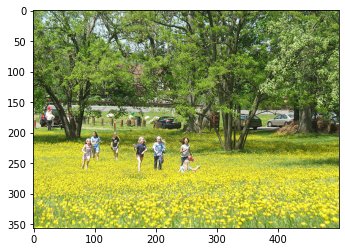

Real Caption: group of seven girls running through field of yellow flowers
Predicted Caption: two children playing in the grass
BLEU-1 score: 0
BLEU-2 score: 0
BLEU-3 score: 0
BLEU-4 score: 0


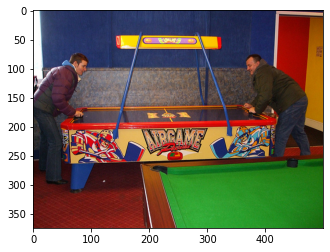

Real Caption: starting game of hair hockey between two men
Predicted Caption: man in blue shirt and black pants is playing pool
BLEU-1 score: 0
BLEU-2 score: 0
BLEU-3 score: 0
BLEU-4 score: 0


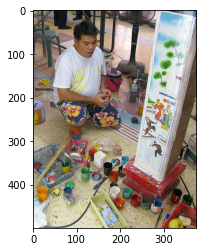

Real Caption: one guy in white shirt and colorful pants painting column with many bright and colorful paints
Predicted Caption: man in blue shirt is standing in front of vegetable market
BLEU-1 score: 11.54066216255058
BLEU-2 score: 4.0372374044186574e-153
BLEU-3 score: 9.747455682531433e-184
BLEU-4 score: 7.551114723170368e-230


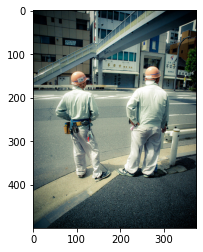

Real Caption: two construction workers wearing orange hard hats stand on the site of the highway
Predicted Caption: two men are sitting on the street in front of an old building
BLEU-1 score: 28.49111011207126
BLEU-2 score: 14.827243801836115
BLEU-3 score: 1.561265199697373e-91
BLEU-4 score: 5.527118757926412e-153


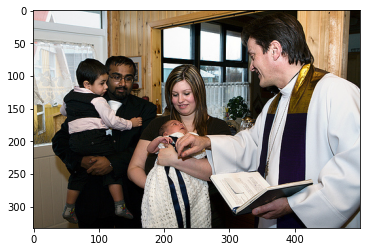

Real Caption: woman holds baby while man looks at it as another man holding child watches
Predicted Caption: man in black shirt and woman in white shirt are talking
BLEU-1 score: 13.84182521267043
BLEU-2 score: 4.842246805851196e-153
BLEU-3 score: 1.1691060350390872e-183
BLEU-4 score: 9.056777564992551e-230


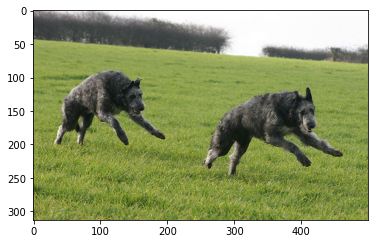

Real Caption: two gray dogs run together over the green grass
Predicted Caption: two dogs playing in the grass
BLEU-1 score: 40.43537731417556
BLEU-2 score: 7.387191291385562e-153
BLEU-3 score: 1.375409564845428e-183
BLEU-4 score: 9.98477465632745e-230


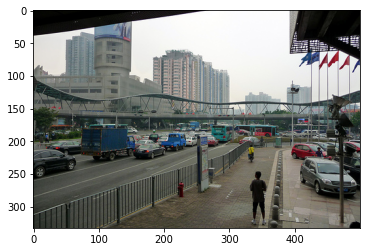

Real Caption: cars line up in very busy road in the middle of the city
Predicted Caption: man in blue shirt walks down the street
BLEU-1 score: 13.381535712974756
BLEU-2 score: 3.9921621141636406e-153
BLEU-3 score: 9.043876231738548e-184
BLEU-4 score: 6.895396983435736e-230


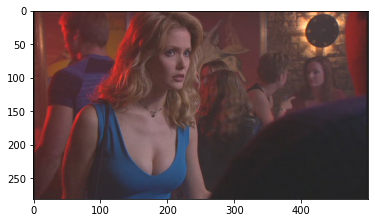

Real Caption: the woman is talking to someone
Predicted Caption: woman in black shirt is holding microphone
BLEU-1 score: 28.57142857142857
BLEU-2 score: 7.973301625706313e-153
BLEU-3 score: 1.7586776545063734e-183
BLEU-4 score: 1.331960397810445e-229


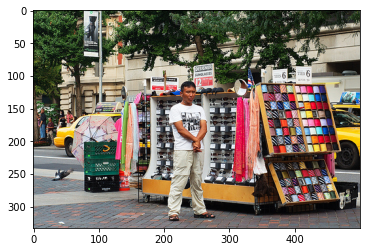

Real Caption: man with white shirt standing next to vending stall
Predicted Caption: two men in costumes are standing in front of an open <unk> <unk> <unk>
BLEU-1 score: 7.1428571428571415
BLEU-2 score: 3.986650812853149e-153
BLEU-3 score: 1.1602945388103906e-183
BLEU-4 score: 9.418382295637229e-230


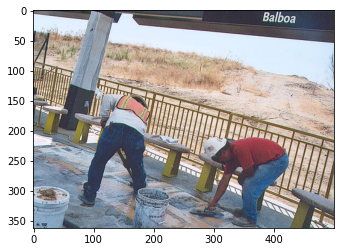

Real Caption: two construction workers smooth out concrete surface
Predicted Caption: man in blue shirt and blue jeans is standing next to man in blue shirt
BLEU-1 score: 0
BLEU-2 score: 0
BLEU-3 score: 0
BLEU-4 score: 0


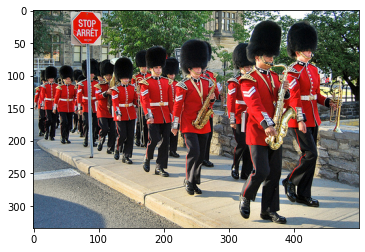

Real Caption: military marching band of soldiers in formal uniform with red coats and fuzzy black hats march by led by the <unk>
Predicted Caption: group of people in bright orange vests are standing in front of an outdoor building
BLEU-1 score: 8.937600613808524
BLEU-2 score: 3.651100531670483e-153
BLEU-3 score: 9.379301294377439e-184
BLEU-4 score: 7.379470737722785e-230


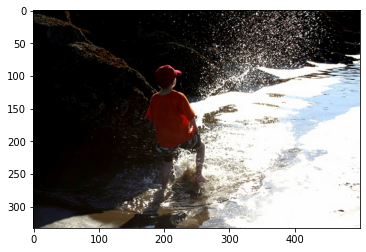

Real Caption: young boy makes splash in the water near the rocks
Predicted Caption: man in red shirt is standing in the snow
BLEU-1 score: 19.885318151430436
BLEU-2 score: 14.91398861357283
BLEU-3 score: 1.5454595293390365e-91
BLEU-4 score: 5.449311673289858e-153


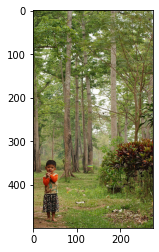

Real Caption: little boy is standing alone in wooded park
Predicted Caption: young boy in red shirt and black pants is standing in the grass
BLEU-1 score: 30.769230769230766
BLEU-2 score: 16.012815380508712
BLEU-3 score: 1.6861024029072228e-91
BLEU-4 score: 5.969061643530969e-153


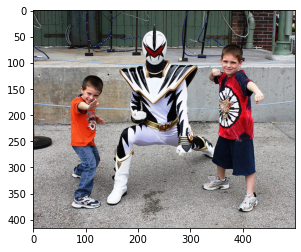

Real Caption: two boys are posing along with an adult in costume
Predicted Caption: two girls are playing with an animal
BLEU-1 score: 37.225089001774606
BLEU-2 score: 20.10384577463796
BLEU-3 score: 1.6282471743409526e-91
BLEU-4 score: 5.398196439422726e-153


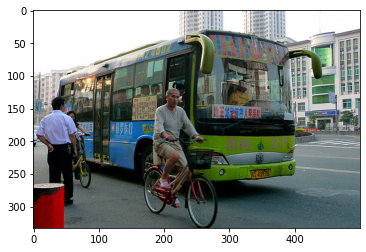

Real Caption: man is riding bicycle near bus
Predicted Caption: man in blue shirt and woman in white shirt are riding bike down the street
BLEU-1 score: 13.333333333333334
BLEU-2 score: 5.4468019467172e-153
BLEU-3 score: 1.3992273317570998e-183
BLEU-4 score: 1.1008876702055895e-229


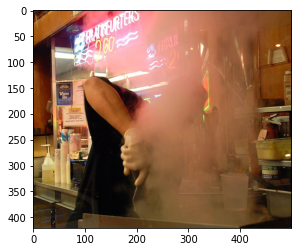

Real Caption: <unk> works over large steaming pot
Predicted Caption: man in white shirt is cooking in kitchen
BLEU-1 score: 0
BLEU-2 score: 0
BLEU-3 score: 0
BLEU-4 score: 0


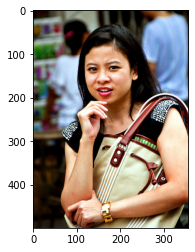

Real Caption: woman of <unk> holds her right hand to her chin and looks at the camera while she holds her purse to her chest with her other arm
Predicted Caption: woman in black shirt is holding drink
BLEU-1 score: 0.8204659895373907
BLEU-2 score: 3.238037088306951e-154
BLEU-3 score: 8.204193029744317e-185
BLEU-4 score: 6.432687245300671e-231


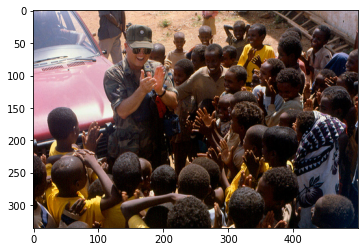

Real Caption: group of black children huddled around white soldier they are all clapping
Predicted Caption: group of people are gathered around fire
BLEU-1 score: 27.973809117540178
BLEU-2 score: 15.10758360312796
BLEU-3 score: 1.2235907790312224e-91
BLEU-4 score: 4.056622047786037e-153


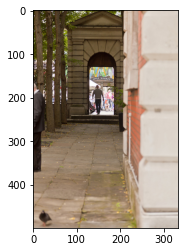

Real Caption: man is walking through an older archway
Predicted Caption: man in black shirt is standing in front of an old building
BLEU-1 score: 25.0
BLEU-2 score: 7.458340731200295e-153
BLEU-3 score: 1.6896185209462902e-183
BLEU-4 score: 1.2882297539194153e-229


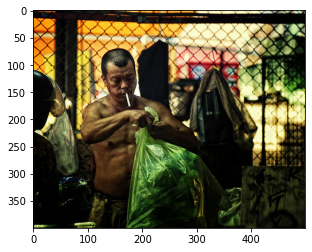

Real Caption: man with cigarette in his mouth is tying green trash bag
Predicted Caption: man in black shirt and black pants is holding up an open air balloon
BLEU-1 score: 21.428571428571423
BLEU-2 score: 6.905081759897607e-153
BLEU-3 score: 1.6132609611386312e-183
BLEU-4 score: 1.239528818333946e-229


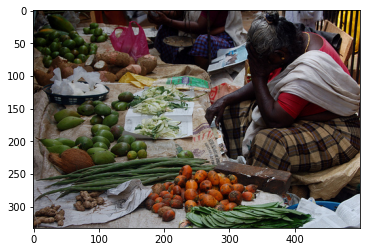

Real Caption: woman in india selling her fruits and vegetables
Predicted Caption: man in blue shirt is standing in front of vegetable market vendor
BLEU-1 score: 8.333333333333332
BLEU-2 score: 4.306075028866568e-153
BLEU-3 score: 1.2152126591739945e-183
BLEU-4 score: 9.788429383461836e-230


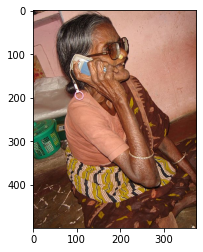

Real Caption: an elderly woman with glasses takes call on cellular phone
Predicted Caption: woman in black and white dress is holding flowers
BLEU-1 score: 9.942659075715216
BLEU-2 score: 4.4493443496507245e-153
BLEU-3 score: 1.1854383244313044e-183
BLEU-4 score: 9.412234823955333e-230


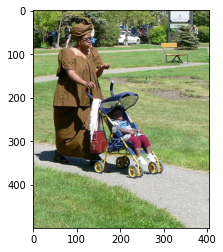

Real Caption: woman is walking her baby with stroller at the local park
Predicted Caption: young girl in pink shirt and black pants is pushing cart
BLEU-1 score: 9.09090909090909
BLEU-2 score: 4.497548684366688e-153
BLEU-3 score: 1.2473514990254889e-183
BLEU-4 score: 1.0003688322288243e-229


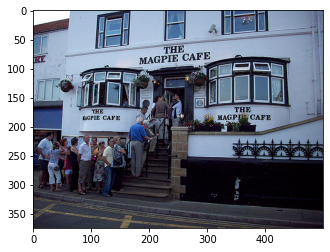

Real Caption: line of people waiting outside the <unk> cafe during the day
Predicted Caption: people are walking down the street in front of an advertisement
BLEU-1 score: 27.27272727272727
BLEU-2 score: 7.789982830837433e-153
BLEU-3 score: 1.7343040158223243e-183
BLEU-4 score: 1.3165594234639305e-229


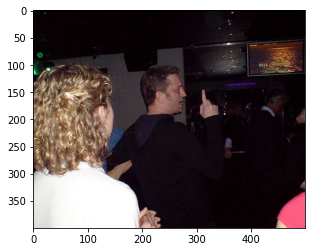

Real Caption: woman in white shirt is looking at man in black shirt pointing upwards
Predicted Caption: man in black shirt is talking to man in black shirt
BLEU-1 score: 53.05700387751149
BLEU-2 score: 42.064917357437594
BLEU-3 score: 35.221124429966395
BLEU-4 score: 24.177037175577336


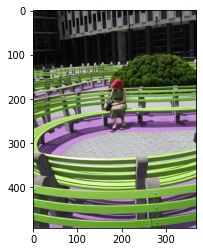

Real Caption: woman sitting alone very long green bench
Predicted Caption: woman in red shirt and black pants is sitting on bench
BLEU-1 score: 27.27272727272727
BLEU-2 score: 7.789982830837433e-153
BLEU-3 score: 1.7343040158223243e-183
BLEU-4 score: 1.3165594234639305e-229


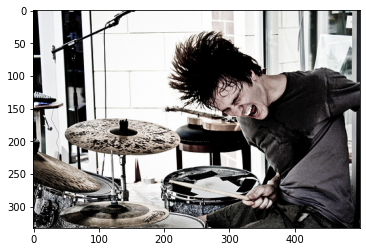

Real Caption: man in gray shirt rocking out on the drums
Predicted Caption: man in black shirt and black pants is playing the drums
BLEU-1 score: 45.45454545454545
BLEU-2 score: 30.15113445777636
BLEU-3 score: 2.4648217855445784e-91
BLEU-4 score: 8.190757052088229e-153


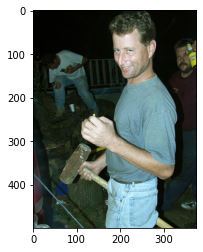

Real Caption: smiling man holding cigarette in one hand and sledgehammer in the other
Predicted Caption: man in blue shirt is holding up
BLEU-1 score: 20.980356838155135
BLEU-2 score: 4.780501720609066e-153
BLEU-3 score: 9.723067014109315e-184
BLEU-4 score: 7.2161206040200775e-230


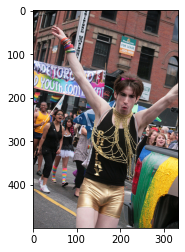

Real Caption: guy in gold chains black top and gold shorts is walking with his arms outstretched in parade
Predicted Caption: man in red shirt is holding up his hands
BLEU-1 score: 13.703743016906248
BLEU-2 score: 3.540560736426082e-153
BLEU-3 score: 7.572351111919078e-184
BLEU-4 score: 5.690998490426158e-230


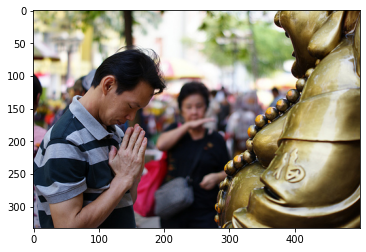

Real Caption: man is praying to an <unk>
Predicted Caption: man in black shirt and black pants is holding up his hands
BLEU-1 score: 16.666666666666668
BLEU-2 score: 6.08970970641905e-153
BLEU-3 score: 1.4961022763680928e-183
BLEU-4 score: 1.1640469867513693e-229


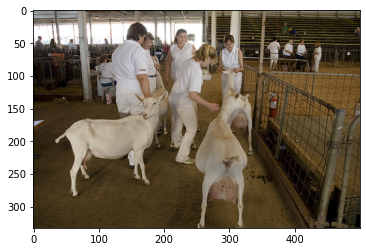

Real Caption: people dressed in all white are looking at some shaved <unk>
Predicted Caption: group of people are gathered around an outdoor fountain
BLEU-1 score: 17.794164509262398
BLEU-2 score: 5.630618124510453e-153
BLEU-3 score: 1.3059694561916118e-183
BLEU-4 score: 1.0016022933125248e-229


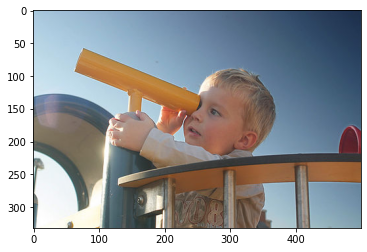

Real Caption: little boy looking through telescope on playground equipment with the sun <unk> off the pole his hand is on
Predicted Caption: young boy is looking at the camera
BLEU-1 score: 10.290989265597277
BLEU-2 score: 2.0307121405581533e-153
BLEU-3 score: 3.8993338344561103e-184
BLEU-4 score: 2.852620410550774e-230


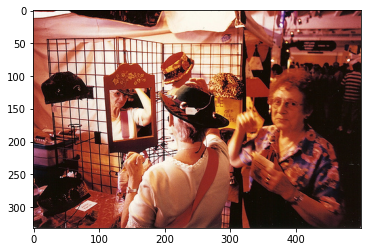

Real Caption: an older woman in white shirt is trying on hat while glancing in the mirror while another older woman in loud print shirt looks on
Predicted Caption: man in black shirt and woman in black and white dress are dancing
BLEU-1 score: 15.280565892219663
BLEU-2 score: 7.11271633745279
BLEU-3 score: 7.162584146967229e-92
BLEU-4 score: 2.5075312444227636e-153


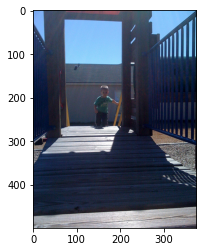

Real Caption: little boy climbing up the steps to bridge on playground
Predicted Caption: woman in black shirt and black pants is walking down the street
BLEU-1 score: 8.333333333333332
BLEU-2 score: 4.306075028866568e-153
BLEU-3 score: 1.2152126591739945e-183
BLEU-4 score: 9.788429383461836e-230


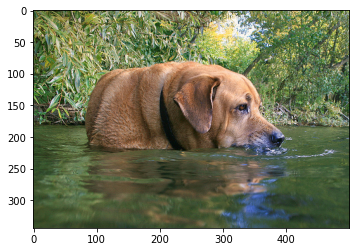

Real Caption: the brown dog is taking drink while wading in the water
Predicted Caption: brown dog is playing in the water
BLEU-1 score: 48.404410457807934
BLEU-2 score: 42.68867747668464
BLEU-3 score: 36.269227650246485
BLEU-4 score: 4.768956028937764e-76


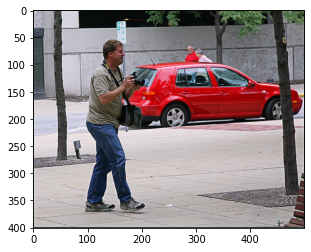

Real Caption: man close to red car is taking pictures
Predicted Caption: man in black shirt and black pants is walking down the street
BLEU-1 score: 16.666666666666668
BLEU-2 score: 6.08970970641905e-153
BLEU-3 score: 1.4961022763680928e-183
BLEU-4 score: 1.1640469867513693e-229


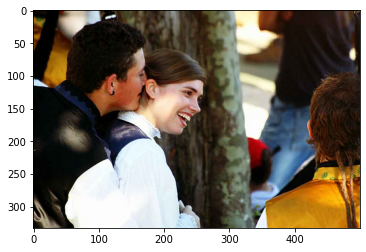

Real Caption: man kisses the neck of woman sitting on his lap
Predicted Caption: man in black shirt and woman in black shirt are kissing
BLEU-1 score: 18.181818181818183
BLEU-2 score: 6.360494346864464e-153
BLEU-3 score: 1.5356698295026469e-183
BLEU-4 score: 1.1896457329133972e-229


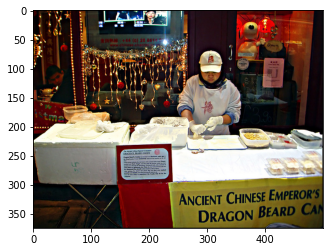

Real Caption: chinese restaurant employee giving food workshop
Predicted Caption: man in white shirt is standing at podium
BLEU-1 score: 0
BLEU-2 score: 0
BLEU-3 score: 0
BLEU-4 score: 0


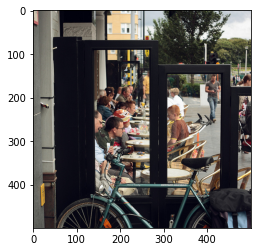

Real Caption: people eating outside at an eatery
Predicted Caption: man in white shirt and woman in black shirt are riding bike
BLEU-1 score: 0
BLEU-2 score: 0
BLEU-3 score: 0
BLEU-4 score: 0


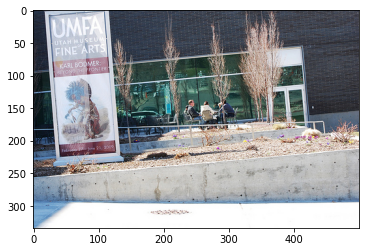

Real Caption: people having coffee outside of museum
Predicted Caption: man in blue shirt is sitting on the steps outside of building
BLEU-1 score: 16.666666666666668
BLEU-2 score: 12.309149097933275
BLEU-3 score: 1.4399259176082162e-91
BLEU-4 score: 5.233427736988301e-153


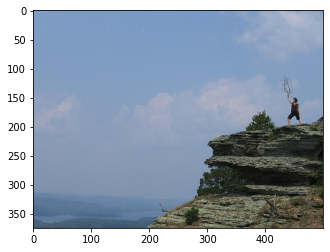

Real Caption: woman holding branch on top cliff
Predicted Caption: man is standing on top of mountain
BLEU-1 score: 28.57142857142857
BLEU-2 score: 21.82178902359924
BLEU-3 score: 2.030194004994321e-91
BLEU-4 score: 6.968148412761693e-153


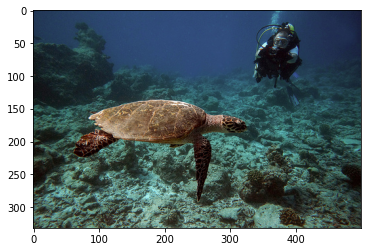

Real Caption: sea turtle is swimming along and scuba diver is filming it in the background
Predicted Caption: man in blue and white swimming trunks is in the water
BLEU-1 score: 34.60456303167608
BLEU-2 score: 16.230978780557674
BLEU-3 score: 1.524167074255524e-91
BLEU-4 score: 5.243515980040811e-153


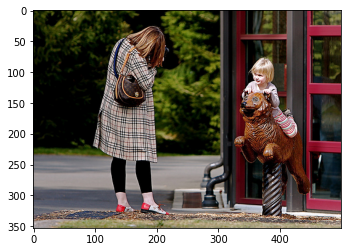

Real Caption: woman stands next to child who is riding on toy
Predicted Caption: woman in black and white striped shirt is walking down the street
BLEU-1 score: 16.666666666666668
BLEU-2 score: 6.08970970641905e-153
BLEU-3 score: 1.4961022763680928e-183
BLEU-4 score: 1.1640469867513693e-229


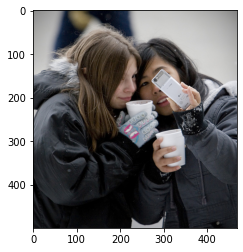

Real Caption: two women dressed for cold weather in jackets and gloves look at something on cellphone screen
Predicted Caption: woman in black shirt is holding baby
BLEU-1 score: 3.949329237565206
BLEU-2 score: 1.5586355447081413e-153
BLEU-3 score: 3.949104510872758e-184
BLEU-4 score: 3.0963867043779474e-230


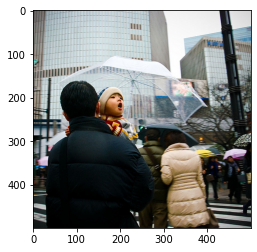

Real Caption: child <unk> new world
Predicted Caption: man in blue shirt and woman in black shirt are standing on the street
BLEU-1 score: 0
BLEU-2 score: 0
BLEU-3 score: 0
BLEU-4 score: 0


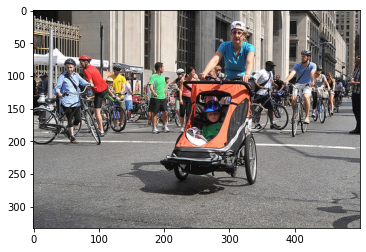

Real Caption: lot of bike riders must be relay race
Predicted Caption: man in blue shirt is riding bike down the street
BLEU-1 score: 10.000000000000002
BLEU-2 score: 4.717068855239749e-153
BLEU-3 score: 1.2835318765197404e-183
BLEU-4 score: 1.0244914152188952e-229


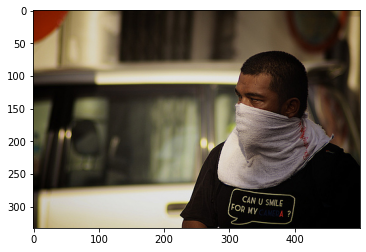

Real Caption: man in black graphic wearing white towel across the bottom portion of his face
Predicted Caption: man in blue shirt is standing in front of an open window
BLEU-1 score: 21.162043122265352
BLEU-2 score: 12.76119215161368
BLEU-3 score: 1.376528199714348e-91
BLEU-4 score: 4.90260194222537e-153


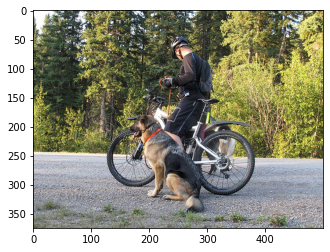

In [ ]:
blue_1 = 0
blue_2 = 0
blue_3 = 0
blue_4 = 0
blue_count_1 = 0
blue_count_2 = 0
blue_count_3 = 0
blue_count_4 = 0
for j in range(250):
    start_token = tokenizer.word_index['<start>']
    end_token = tokenizer.word_index['<end>']
    # select random image from validation data
    rid = np.random.randint(0, len(img_name_val))
    image = img_name_val[rid]
    temp_image = np.array(Image.open(image))
    plt.imshow(temp_image)
    plt.show()
    real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
    caption,result,attention_weights = evaluate(image)
    first = real_caption.split(' ', 1)[1]
    real_caption = first.rsplit(' ', 1)[0]

    #remove "<unk>" in result
    for i in caption:
        if i=="<unk>":
            caption.remove(i)

    for i in real_caption:
        if i=="<unk>":
            real_caption.remove(i)

    #remove <end> from result         
    result_join = ' '.join(caption)
    result_final = result_join.rsplit(' ', 1)[0]

    real_appn = []
    real_appn.append(real_caption.split())
    reference = real_appn
    candidate = caption
    print ('Real Caption:', real_caption)
    print ('Predicted Caption:', ' '.join(caption))
    score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
    if score > 0.1:
        blue_1 +=score
        blue_count_1 +=1
    print(f"BLEU-1 score: {score*100}")
    score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
    if score > 0.1:
        blue_2 +=score
        blue_count_2 +=1
    print(f"BLEU-2 score: {score*100}")
    score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
    if score > 0.1:
        blue_3 +=score
        blue_count_3 += 1
    print(f"BLEU-3 score: {score*100}")
    score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
    if score > 0.1:
        blue_4 +=score
        blue_count_4 += 1
    print(f"BLEU-4 score: {score*100}")

print(f"BLEU-1 count: {blue_count_1}")
print(f"BLEU-2 count: {blue_count_2}")
print(f"BLEU-3 count: {blue_count_3}")
print(f"BLEU-4 count: {blue_count_4}")
print(f"BLEU-1 Total: {blue_1}")
print(f"BLEU-2 Total: {blue_2}")
print(f"BLEU-3 Total: {blue_3}")
print(f"BLEU-4 Total: {blue_4}")
if blue_count_1 > 0:
    print(f"BLEU-1 Average: {blue_1/blue_count_1}")
if blue_count_2 > 0:
    print(f"BLEU-2 Average: {blue_2/blue_count_2}")
if blue_count_3 > 0:
    print(f"BLEU-3 Average: {blue_3/blue_count_3}")
if blue_count_4 > 0:
    print(f"BLEU-4 Average: {blue_4/blue_count_4}")
"""
print(f"BLEU-1 count: {blue_count_1}", f"BLEU-1 Average: {blue_1/blue_count_1}")
print(f"BLEU-1 count: {blue_count_2}",f"BLEU-1 Average: {blue_2/blue_count_2}")
print(f"BLEU-1 count: {blue_count_3}",f"BLEU-1 Average: {blue_3/blue_count_3}")
print(f"BLEU-1 count: {blue_count_4}",f"BLEU-1 Average: {blue_4/blue_count_4}")
"""

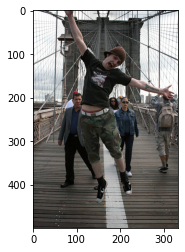

Real Caption: man wearing brown cap and cutoff camouflage pants is leaping in the air on bridge while several other people walk behind him
Predicted Caption: man in black shirt and black pants is walking down the street
BLEU-1 score: 21.729910425353914
BLEU-2 score: 9.265664938057402
BLEU-3 score: 8.700905601939133e-92
BLEU-4 score: 2.9933291654971015e-153


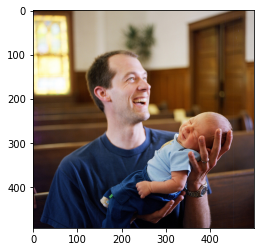

Real Caption: man in blue smiles while holding baby in light blue shirt
Predicted Caption: man in white shirt and black pants is holding up his hands
BLEU-1 score: 33.33333333333333
BLEU-2 score: 17.407765595569778
BLEU-3 score: 1.7727567490939188e-91
BLEU-4 score: 6.223629500679345e-153


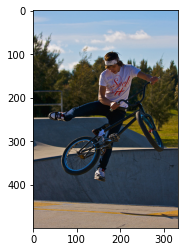

Real Caption: man doing tricks on bmx bike
Predicted Caption: man in blue shirt and black pants is riding bike down the street
BLEU-1 score: 15.384615384615385
BLEU-2 score: 5.850803834986753e-153
BLEU-3 score: 1.4606045589277217e-183
BLEU-4 score: 1.1409851298103346e-229


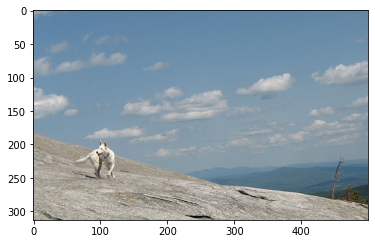

Real Caption: white dog standing on rock in front of blue sky
Predicted Caption: person is walking down dirt path
BLEU-1 score: 0
BLEU-2 score: 0
BLEU-3 score: 0
BLEU-4 score: 0


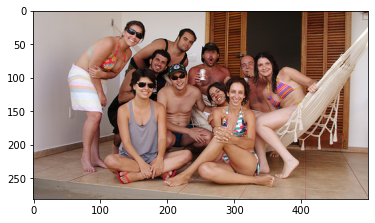

Real Caption: friends pose for group picture in summer clothing
Predicted Caption: group of children are sitting on the floor
BLEU-1 score: 12.500000000000004
BLEU-2 score: 5.273843307431706e-153
BLEU-3 score: 1.372396692566494e-183
BLEU-4 score: 1.0832677820940878e-229


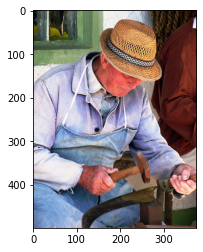

Real Caption: man wearing hat hammering with steel hammer
Predicted Caption: man in blue shirt and hat is holding up an old
BLEU-1 score: 18.181818181818183
BLEU-2 score: 6.360494346864464e-153
BLEU-3 score: 1.5356698295026469e-183
BLEU-4 score: 1.1896457329133972e-229


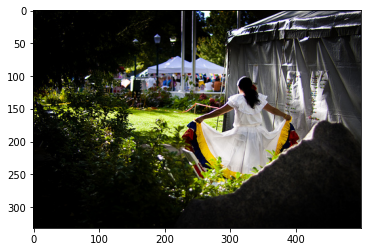

Real Caption: girl in white dress with yellow trim is standing outside of tent and in front of her is white canopy tent with several people beneath it
Predicted Caption: two girls jumping on trampoline
BLEU-1 score: 0
BLEU-2 score: 0
BLEU-3 score: 0
BLEU-4 score: 0


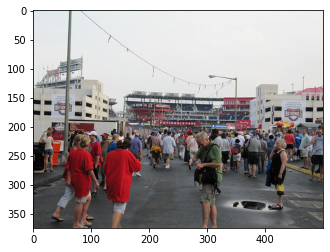

Real Caption: americans go to baseball game
Predicted Caption: group of people are walking down the street in the street
BLEU-1 score: 0
BLEU-2 score: 0
BLEU-3 score: 0
BLEU-4 score: 0


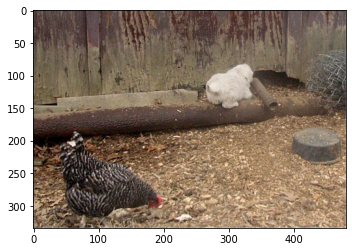

Real Caption: white dog rests on log as chicken <unk> at the ground
Predicted Caption: two dogs fight in the snow
BLEU-1 score: 7.243303475117973
BLEU-2 score: 2.646576928737885e-153
BLEU-3 score: 6.502033690529349e-184
BLEU-4 score: 5.058927350602078e-230


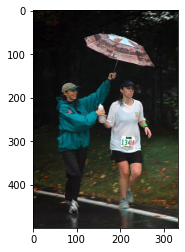

Real Caption: woman <unk> marathon runner by holding an umbrella over her and giving her water
Predicted Caption: two women in shorts and sandals are running down the street
BLEU-1 score: 6.920912606335215
BLEU-2 score: 3.423985552596375e-153
BLEU-3 score: 9.496091785550296e-184
BLEU-4 score: 7.615811788153039e-230


In [ ]:
blue_1 = 0
blue_2 = 0
blue_3 = 0
blue_4 = 0
blue_count_1 = 0
blue_count_2 = 0
blue_count_3 = 0
blue_count_4 = 0
for j in range(10):
    start_token = tokenizer.word_index['<start>']
    end_token = tokenizer.word_index['<end>']
    # select random image from validation data
    rid = np.random.randint(0, len(img_name_val))
    image = img_name_val[rid]
    temp_image = np.array(Image.open(image))
    plt.imshow(temp_image)
    plt.show()
    real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
    caption,result,attention_weights = evaluate(image)
    first = real_caption.split(' ', 1)[1]
    real_caption = first.rsplit(' ', 1)[0]

    #remove "<unk>" in result
    for i in caption:
        if i=="<unk>":
            caption.remove(i)

    for i in real_caption:
        if i=="<unk>":
            real_caption.remove(i)

    #remove <end> from result         
    result_join = ' '.join(caption)
    result_final = result_join.rsplit(' ', 1)[0]

    real_appn = []
    real_appn.append(real_caption.split())
    reference = real_appn
    candidate = caption
    print ('Real Caption:', real_caption)
    print ('Predicted Caption:', ' '.join(caption))
    score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
    if score > 0.1:
        blue_1 +=score
        blue_count_1 +=1
    print(f"BLEU-1 score: {score*100}")
    score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
    if score > 0.1:
        blue_2 +=score
        blue_count_2 +=1
    print(f"BLEU-2 score: {score*100}")
    score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
    if score > 0.1:
        blue_3 +=score
        blue_count_3 += 1
    print(f"BLEU-3 score: {score*100}")
    score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
    if score > 0.1:
        blue_4 +=score
        blue_count_4 += 1
    print(f"BLEU-4 score: {score*100}")
